# **Project 3**, APS1070 Fall 2023
#### **PCA [11 marks]**
**Deadline: Nov 17th, 23:00**

**Academic Integrity**

This project is individual - it is to be completed on your own. If you have questions, please post your query in the APS1070 Piazza Q&A forums (the answer might be useful to others!).

Do not share your code with others, or post your work online. Do not submit code that you have not written yourself. Students suspected of plagiarism on a project, midterm or exam will be referred to the department for formal discipline for breaches of the Student Code of Conduct.

In this project we work on a [temperature dataset](https://berkeleyearth.org/data/) that reports the average earth surface temperature for different cities for each month over the years 1992-2006.

Please fill out the following:


*   **Name**: Yuchen Ding
*   **Student number**: 1010743420



### How to submit **(HTML + IPYNB)**

1. Download your notebook: `File -> Download .ipynb`

2. Click on the Files icon on the far left menu of Colab

3. Select & upload your `.ipynb` file you just downloaded, and then obtain its path (right click) (you might need to hit the Refresh button before your file shows up)


4. execute the following in a Colab cell:
```
%%shell
jupyter nbconvert --to html /PATH/TO/YOUR/NOTEBOOKFILE.ipynb
```

5. An HTML version of your notebook will appear in the files, so you can download it.

6. Submit **both** <font color='red'>`HTML` and `IPYNB`</font>  files on Quercus for grading.



Ref: https://stackoverflow.com/a/64487858



# Part 1: Getting started with GitHub [1 Mark + 1 Mark Git Submission]

This first part of the project assignment is to be completed independently from Parts 2 - 5. In this part you will be completing some coding tasks and submitting your results on Github. To access this part of the assignment and upload your answers, you will need to use Github. Please complete the following step-by-step instructions:

 0. Create a Github account and install git for Windows or Mac:
  * https://git-scm.com/download/win
  * https://git-scm.com/download/mac

 1. Open this link: https://classroom.github.com/a/BWpQKQJt to create your assignment repository in GitHub. You should get a link similar to:
```
https://github.com/APS1070-UofT/project-3-part-1-*********
```
This your private repository to get this part questions and upload your answers. **Copy this link to the text box below to be graded for this part.**


 2. Open `Git Bash`, the app you downloaded in step `0`, and set your Email and username by:
```
git config --global user.email “<your-GitHub-email>”
git config --global user.name “<your-GitHub-username>”
```

 3. Create a folder for the course on your computer and `cd` to that. `cd` means `Change Directory`. For example, on a Windows machine, where I have a folder on "C:\aps1070":
 ```
cd c:aps1070
```
 4. Get your assignment by the link you got in step 1:
```
git clone https://github.com/APS1070-UofT/project-3-part-1-*********
```

 5. A new folder should be created in your directory similar to:
```
C:\aps1070\project-3-part-1-********
```
This folder has an `ipynb` notebook which you need to manually upload to colab and answer its questions.

 6. After you finished working on this notebook, download the notebook from colab and move it to the directory in step 5.

 7. Replace the old notebook with the new one that has your answers. Make sure your completed notebook has the same name as the original notebook you downloaded.

 8. To submit your work, follow:
```
cd <your assignment folder>
git add F23_Project_3_Part_1_git.ipynb
git commit -m “Final Submission”
git push
```
If you have any problem with pushing your work on GitHub you can try one of following commands:
```
git push --force
or
git push origin HEAD:main
```

 9. Make sure your submission is ready for grading. Open the private repository link in your browser and make sure you can see your final submission with your latest changes there. **Only you and the teaching team can open that link.**

# Part 2: Applying PCA [2 Marks]

1. Compute the covariance matrix of the dataframe. *Hint: The dimensions of your covariance matrix should be (180, 180).* **[0.25]**
2. Write a function `get_sorted_eigen(df_cov)` that gets the covariance matrix of dataframe `df` (from step 1), and returns sorted eigenvalues and eigenvectors using `np.linalg.eigh`. **[0.25]**
3. Show the effectiveness of your principal components in covering the variance of the dataset with a `scree plot`. **[0.25]**
4. How many PCs do you need to cover 99% of the dataset's variance? **[0.25]**
5. Plot the first 16 principal components (Eigenvectors) as a time series (16 subplots, on the x-axis you have dates and on the y-axis you have the value of the PC element) . **[0.5]**
6. Compare the first two PCs with the rest of them. Do you see any difference in their trend? **[0.5]**

In [1]:
import pandas as pd
data_raw = pd.read_csv(
    filepath_or_buffer='https://raw.githubusercontent.com/Sabaae/Dataset/main/TemperaturesbyCity.csv',
    index_col=0
)

In [2]:
### YOUR CODE HERE ###
import numpy as np
from sklearn.preprocessing import StandardScaler

# Standardize dataframe
X_std = StandardScaler().fit_transform(data_raw)
print(f'Mean for the whole standardized dataset is: {X_std.mean()}')
print(f'Variance for the whole standardized dataset is: {X_std.var()}\n')

n, m = X_std.shape

# Compute covariance matrix
C = np.cov(X_std, rowvar=False)
print(f'The covariance matrix is: \n {C}\n')
print(f'Covariance matrix has dimension of: {C.shape}')

Mean for the whole standardized dataset is: -7.349968361014183e-18
Variance for the whole standardized dataset is: 0.9999999999999998

The covariance matrix is: 
 [[1.00029011 0.99268854 0.96789139 ... 0.86857023 0.96788687 0.9928223 ]
 [0.99268854 1.00029011 0.97955289 ... 0.8810364  0.97015331 0.98397652]
 [0.96789139 0.97955289 1.00029011 ... 0.91140956 0.96641666 0.96294613]
 ...
 [0.86857023 0.8810364  0.91140956 ... 1.00029011 0.95453146 0.87196505]
 [0.96788687 0.97015331 0.96641666 ... 0.95453146 1.00029011 0.97085605]
 [0.9928223  0.98397652 0.96294613 ... 0.87196505 0.97085605 1.00029011]]

Covariance matrix has dimension of: (180, 180)


In [3]:
# Create function to get eignValues and eignVectors

def get_sorted_eigen(C):
  eigenValues, eigenVectors = np.linalg.eigh(C)
  print ("Eig Vec:\n ",eigenVectors, " \n Eig Val: \n", eigenValues)
  return eigenValues, eigenVectors

eigenValues, eigenVectors = get_sorted_eigen(C)


Eig Vec:
  [[-0.12647356  0.0095694   0.03510024 ...  0.02405697  0.0844217
  -0.07298711]
 [ 0.17636591  0.17036325  0.05066302 ...  0.00564229  0.07884522
  -0.07442839]
 [ 0.02816808 -0.18560112 -0.19406253 ... -0.05971086  0.06074602
  -0.07803351]
 ...
 [ 0.01153292 -0.03901067 -0.02504244 ...  0.04805317  0.00788699
  -0.08319075]
 [ 0.15036916  0.04519468  0.06239269 ...  0.05195168  0.05183775
  -0.07977214]
 [ 0.02229122  0.12346996 -0.13698061 ...  0.02907275  0.08091714
  -0.07330759]]  
 Eig Val: 
 [1.26970482e-04 1.36833886e-04 1.41200464e-04 1.53546738e-04
 1.64147748e-04 1.68246705e-04 1.80149441e-04 1.86216760e-04
 1.92724728e-04 1.94445294e-04 2.01447885e-04 2.14424483e-04
 2.26124706e-04 2.28892705e-04 2.35968197e-04 2.40547056e-04
 2.56418644e-04 2.61440081e-04 2.67615794e-04 2.81998085e-04
 2.85718676e-04 2.96077998e-04 3.04914179e-04 3.14882148e-04
 3.23476235e-04 3.27302778e-04 3.37945772e-04 3.50132674e-04
 3.59029219e-04 3.70153475e-04 3.79035987e-04 3.90336591e

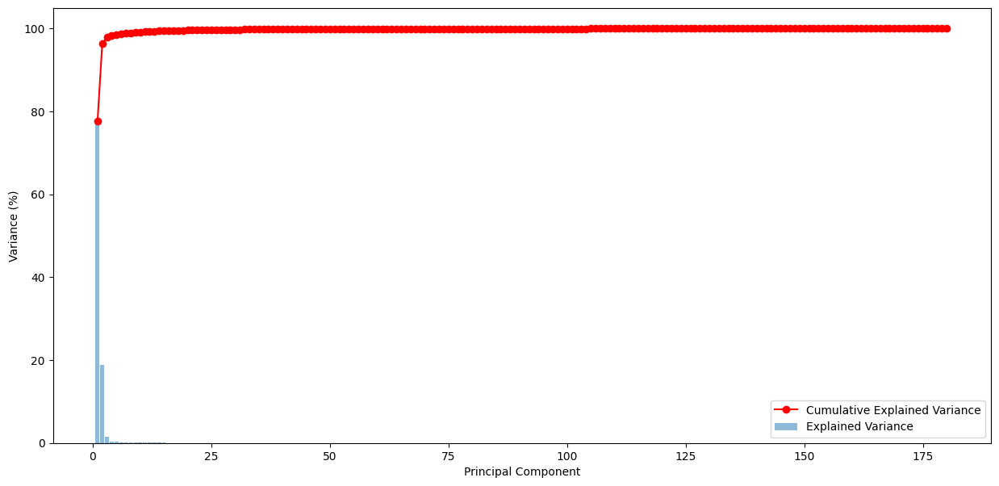

In [4]:
import matplotlib.pyplot as plt

# Adjust the code according to the user's input and corrections mentioned
# Sorting the eigenvalues and eigenvectors in decreasing order
args = (-eigenValues).argsort()
sorted_eigenvalues = eigenValues[args]
sorted_eigenvectors = eigenVectors[:, args]

# Explained variance (as a percentage)
eig_val_sum = sum(sorted_eigenvalues)
exp_var_percentage = [eigV/eig_val_sum * 100 for eigV in sorted_eigenvalues]
cum_exp_var_percentage = np.cumsum(exp_var_percentage)

# Scree plot with correct figsize and percentage
plt.figure(figsize=(15, 7))  # Set the figure size
plt.bar(range(1, 181), exp_var_percentage, label='Explained Variance', alpha=0.5)
plt.plot(range(1, 181), cum_exp_var_percentage, 'r-o', label='Cumulative Explained Variance')
plt.xlabel('Principal Component')
plt.ylabel('Variance (%)')
plt.legend()
plt.show()


In [5]:
# Find the number of principal components needed to cover at least 99% of the dataset's variance
num_pcs_to_cover_99 = next((i for i, cum_var in enumerate(cum_exp_var_percentage, start=1) if cum_var >= 99), None)

# Print the result
if num_pcs_to_cover_99:
    print(f'There should be {num_pcs_to_cover_99} PCs to cover 99% dataset variance')
else:
    print("No principal components cover 99% of the dataset variance.")



There should be 9 PCs to cover 99% dataset variance


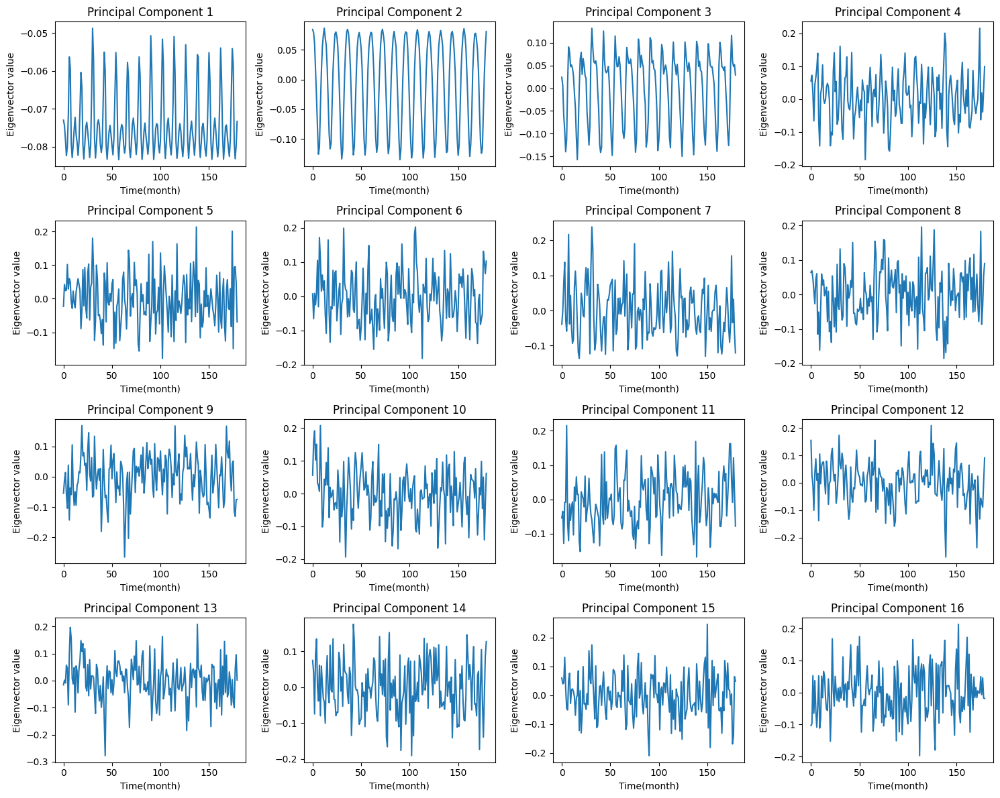

In [6]:
# Plot the first 16 principal components as time series
plt.figure(figsize=(15, 12))

# We create a loop to plot each of the first 16 PCs
for i in range(16):
    plt.subplot(4, 4, i+1)
    plt.plot(sorted_eigenvectors[:, i], label=f'PC{i+1}')
    plt.title(f'Principal Component {i+1}')
    plt.xlabel('Time(month)')
    plt.ylabel('Eigenvector value')

# Improve layout
plt.tight_layout()

# Show the plot
plt.show()


By comparing the first two PCs with the rest of them, the first two PCs' have smaller fluctuation in eigenvectors differences. The distributions of these two PCs eigenvectors are more regular and will repeat the fluctuation after approximately one year. PC3 also has the similar trend with PC1 and PC2, while the other PCs' distribution looks to be disorganized. That indicates the first few principal components can capture more variance than the rest of PCs.

# Part 3: Data reconstruction [3 Marks]

Create a function that:

*   Accepts a city and the original dataset as inputs.
*   Calls useful functions that you designed in previous parts to compute eigenvectors and eigenvalues.
*   Plots 4 figures:
  1.   The original time-series for the specified city. **[0.5]**
  2.   The incremental reconstruction of the **original** (not standardized) time-series for the specified city in a single plot. **[1.5]**
       * You should at least show 5 curves in a figure for incremental reconstruction. For example, you can pick the following (or any other combination that you think is reasonable):
          * Reconstruction with only PC1
          * Reconstruction with both PC1 and PC2
          * Reconstruction with PC1 to PC4 (First 4 PCs)
          * Reconstruction with PC1 to PC8 (First 8 PCs)
          * Reconstruction with PC1 to PC16 (First 16 PCs)

      * Hint: you need to compute the reconstruction for the standardized time-series first, and then scale it back to the original (non-standardized form) using the StandardScaler `inverse_transform` [help...](https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.StandardScaler.html#sklearn.preprocessing.StandardScaler.inverse_transform)
  3.   The residual error for your best reconstruction with respect to the original time-series. **[0.5]**
      * Hint: You are plotting the error that we have for reconstructing each month `(df - df_reconstructed)`. On the x-axis, you have dates, and on the y-axis, the residual error.
  4.   The RMSE of the reconstruction as a function of the number of included components (x-axis is the number of components and y-axis is the RMSE). Sweep x-axis from 1 to 10 (this part is independent from part 3.2.) **[1]**

Test your function using the `Yakeshi`, `Zamboanga`, `Norilsk`, `Juliaca`, and `Doha` as inputs. **[0.5]**


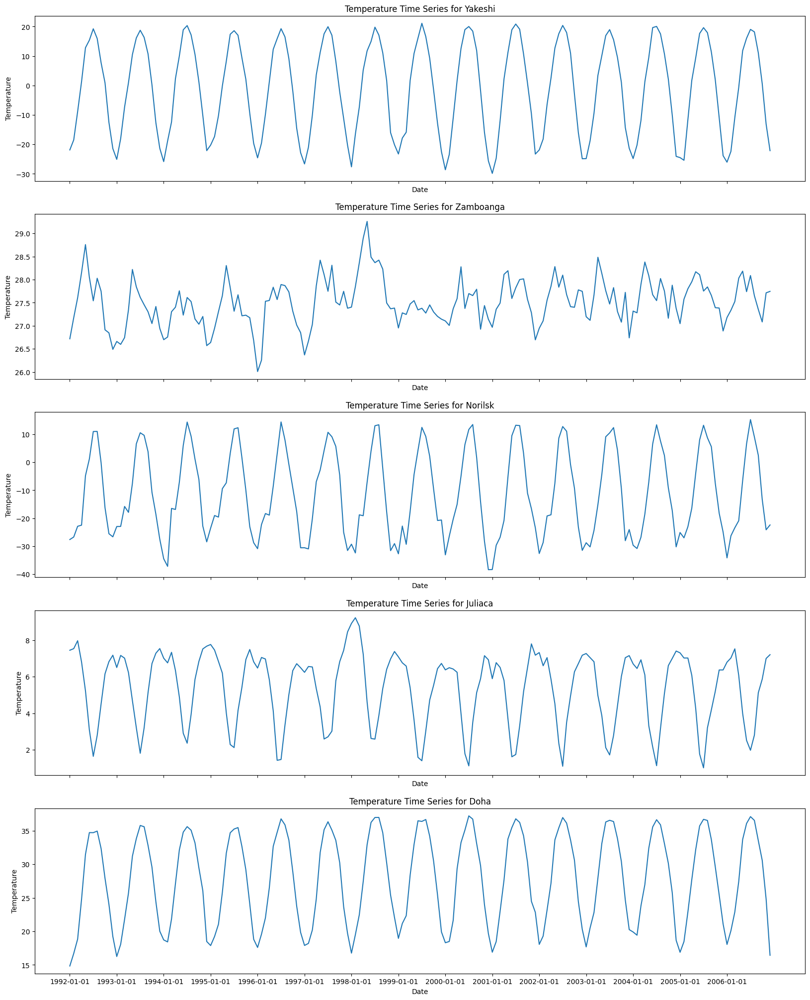

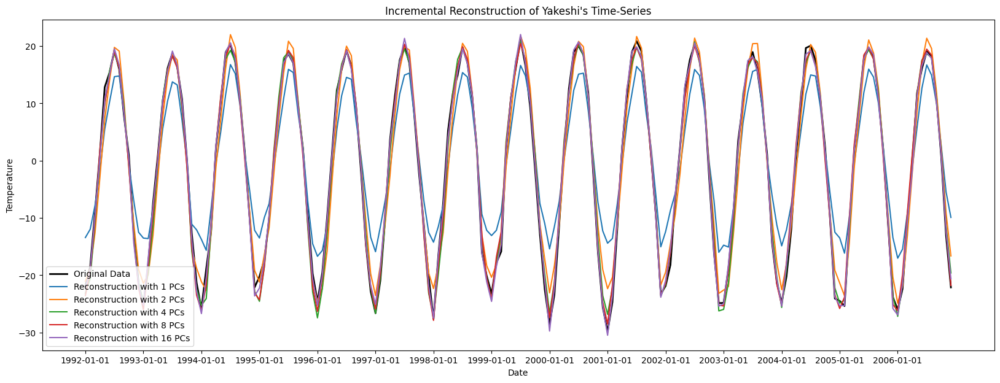

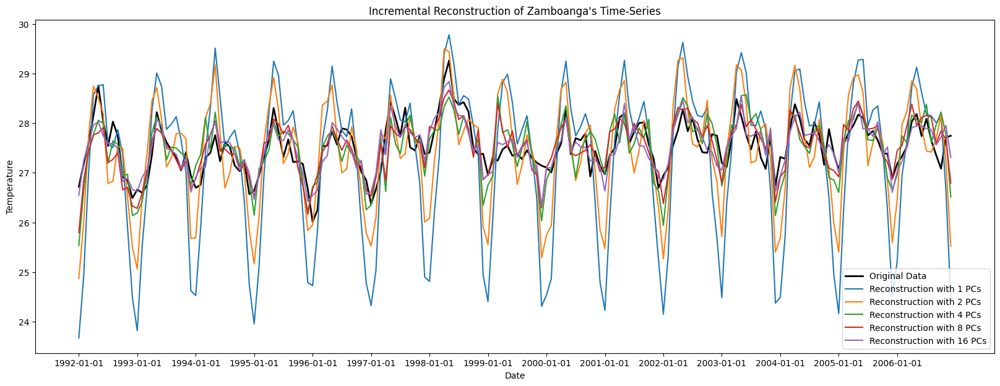

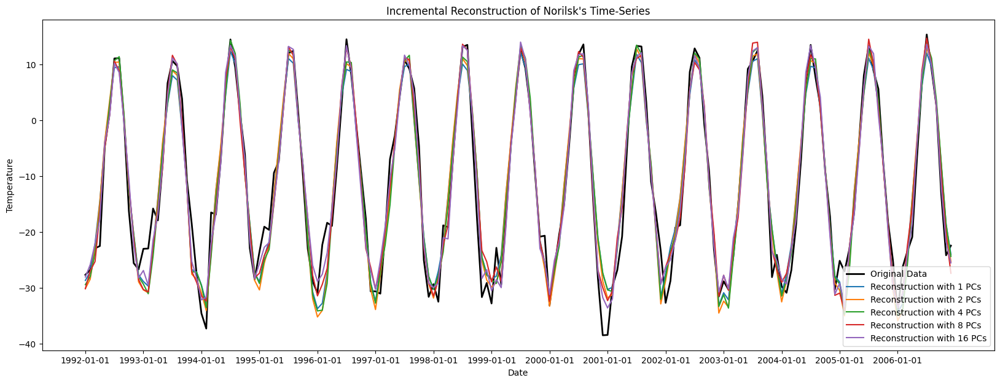

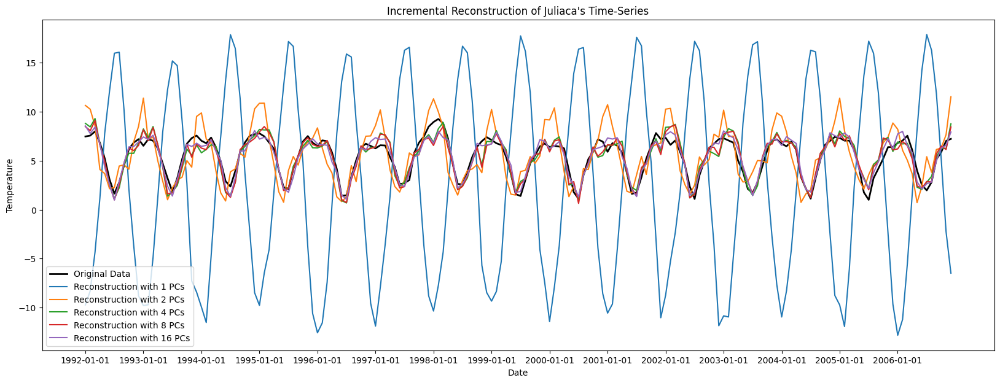

...

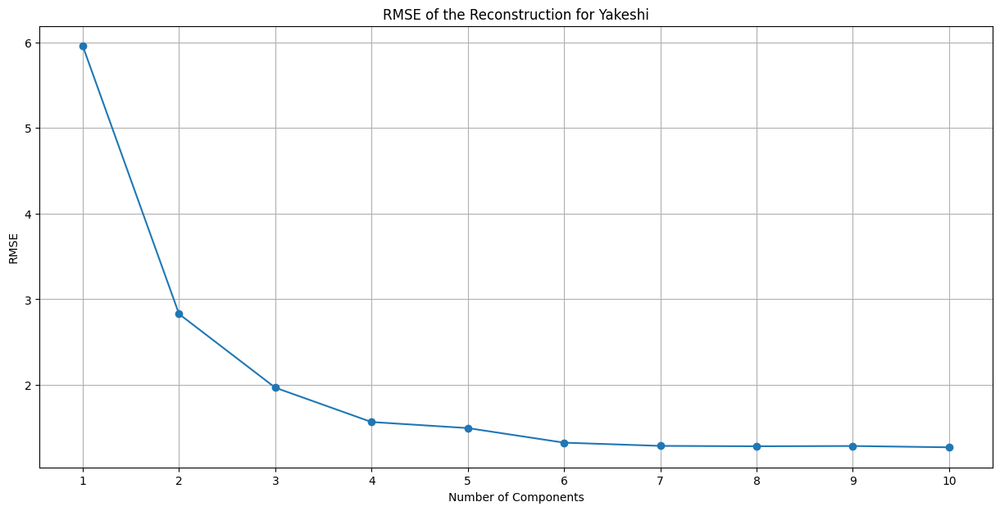

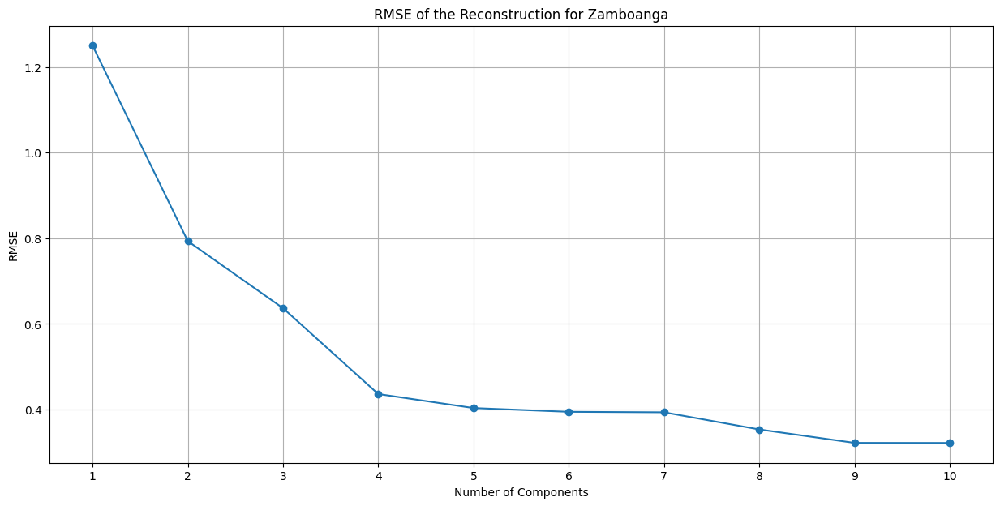

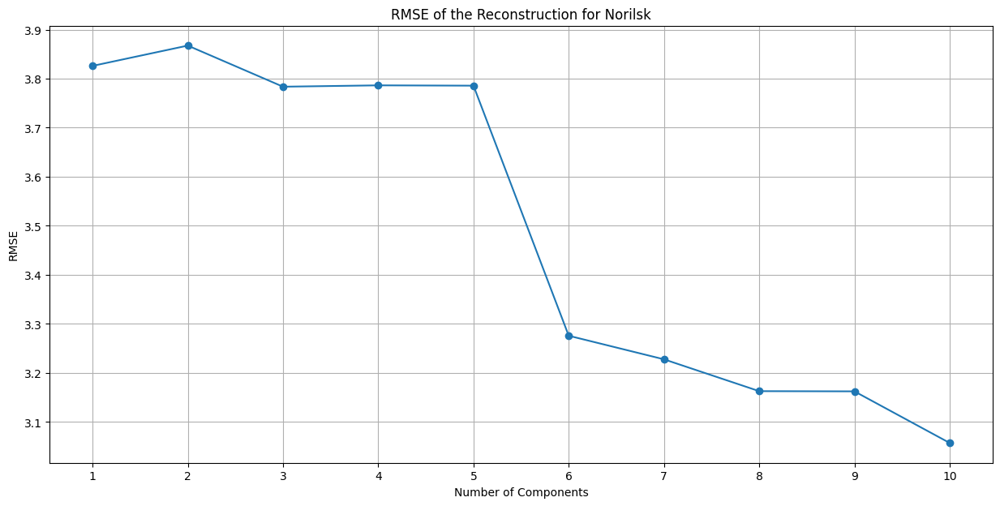

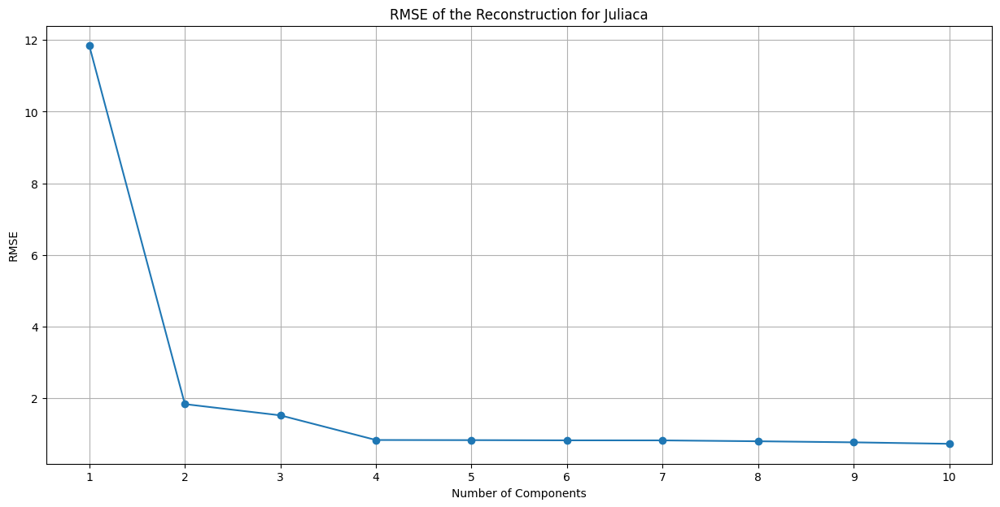

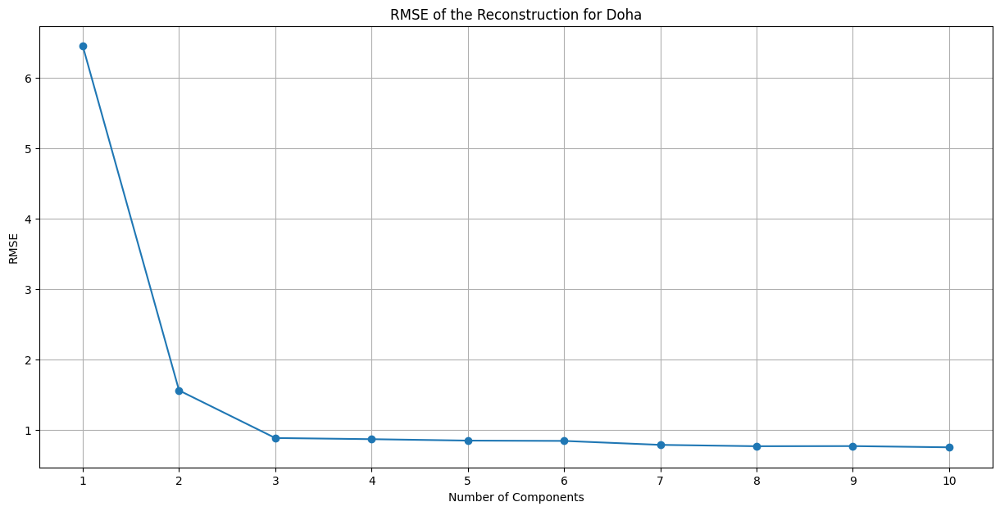

In [7]:
# Since the function plot_city_figures is dependent on other variables and functions defined earlier,
# we need to ensure they are all available in the current scope.
# We already have eigenValues and eigenVectors sorted, so we will create a StandardScaler object again.

# StandardScaler object for later inverse transform
from sklearn.preprocessing import StandardScaler

original_df = data_raw
scaler = StandardScaler().fit(original_df)
X_std = scaler.transform(original_df)


# Compute sorted eigenvalues and eigenvectors
# This uses the previously computed covariance matrix 'C'
eigenValues, eigenVectors = np.linalg.eigh(C)
args = (-eigenValues).argsort()
sorted_eigenvalues = eigenValues[args]
sorted_eigenvectors = eigenVectors[:, args]

def plot_city_figures(original_df, city_names):
    # Plot the original time-series for the specified city
    fig, axes = plt.subplots(len(city_names), 1, figsize=(20, len(city_names) * 5), sharex=True)
    if len(city_names) == 1:
        axes = [axes]  # Ensure axes is a list even for one city
    for i, city in enumerate(city_names):
        city_data = original_df.loc[city].values
        axes[i].plot(original_df.columns, city_data)
        axes[i].set_title(f"Temperature Time Series for {city}")
        axes[i].set_xlabel('Date')
        axes[i].set_ylabel('Temperature')
        selected_dates = original_df.columns[::12]
        axes[i].set_xticks(selected_dates)
    plt.show()

    # The incremental reconstruction of the original time-series for city
    for city in city_names:
        city_data_std = X_std[original_df.index == city]
        PC_count = [1, 2, 4, 8, 16]

        plt.figure(figsize=(20, 7))
        plt.plot(original_df.columns, original_df.loc[city].values, label='Original Data', color='black', linewidth=2)

        for pc in PC_count:
            W = sorted_eigenvectors[:, :pc]
            projX = np.dot(city_data_std, W)

            # Reconstruction
            ReconX = scaler.inverse_transform(np.dot(projX, W.T))

            plt.plot(original_df.columns, ReconX.flatten(), label=f'Reconstruction with {pc} PCs')
        plt.title(f"Incremental Reconstruction of {city}'s Time-Series")
        plt.xlabel('Date')
        plt.ylabel('Temperature')
        selected_dates = original_df.columns[::12]
        plt.xticks(selected_dates)
        plt.legend()
        plt.show()

    # Calculate best reconstruction residual error and generate a plot
    for city in city_names:
      city_data_std = X_std[original_df.index == city]
      # Best reconstruction is when there are 16 principal components
      W = sorted_eigenvectors[:, :16]
      projX = np.dot(city_data_std, W)

      best_recon = scaler.inverse_transform(np.dot(projX, W.T))
      residuals = original_df.loc[city].values - best_recon.flatten()

      plt.figure(figsize=(15, 7))
      plt.plot(residuals, label='Residual Error', color='red')
      plt.title(f"Residual Error for {city}'s Time-Series Reconstruction")
      plt.xlabel('Date')
      plt.ylabel('Residual Error')
      plt.legend()
      plt.show()

    RMSE_values_PCA = []

    for city in city_names:
      city_data_std = X_std[original_df.index == city]
      RMSE_values = []
      for pc in range(1, 11):
        W = sorted_eigenvectors[:, :pc]
        projX = np.dot(city_data_std, W)
        ReconX = scaler.inverse_transform(np.dot(projX, W.T))

        RMSE = np.sqrt(np.mean((original_df.loc[city].values - ReconX.flatten()) ** 2))
        RMSE_values.append(RMSE)

      plt.figure(figsize=(15, 7))
      plt.plot(range(1, 11), RMSE_values, 'o-')
      plt.title(f"RMSE of the Reconstruction for {city}")
      plt.xlabel('Number of Components')
      plt.ylabel('RMSE')
      plt.xticks(range(1, 11))
      plt.grid(True)
      plt.show()

      RMSE_values_PCA.append(RMSE_values)

    return RMSE_values_PCA





city_names = ['Yakeshi','Zamboanga','Norilsk', 'Juliaca', 'Doha']
RMSE_values_PCA = plot_city_figures(original_df, city_names)


# Part 4: SVD [2 Marks]
Modify your code in part 3 to use SVD instead of PCA for extracting the eigenvectors. **[1]**

Explain if standardization or covariance computation is required for this part.
Repeat part 3 and compare your PCA and SVD results. Write a function to make this comparison **[0.5]**, and comment on the results. **[0.5]**.

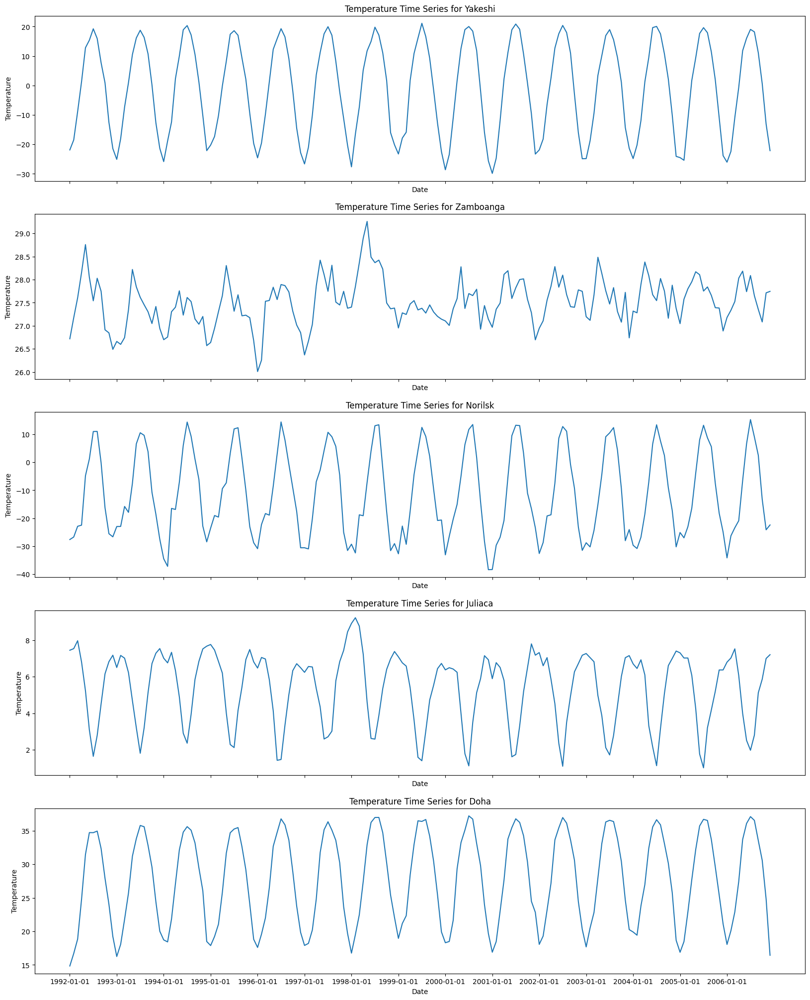

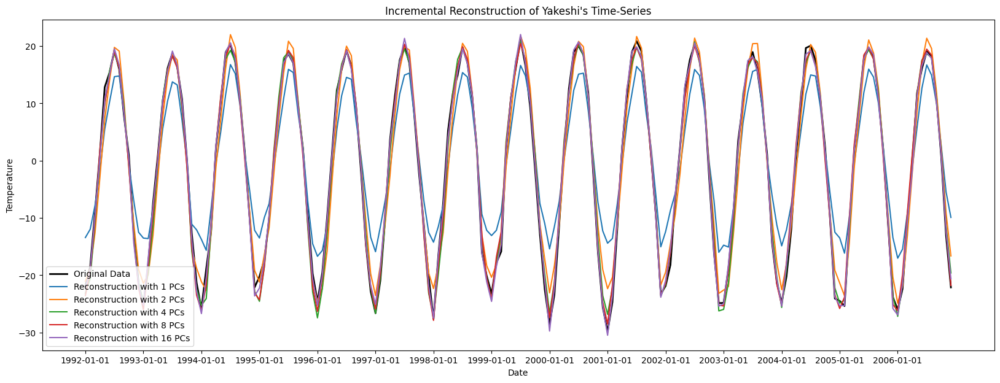

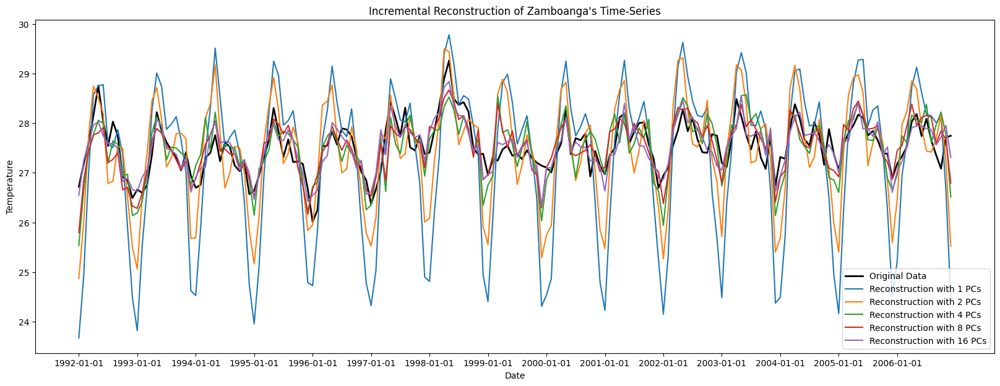

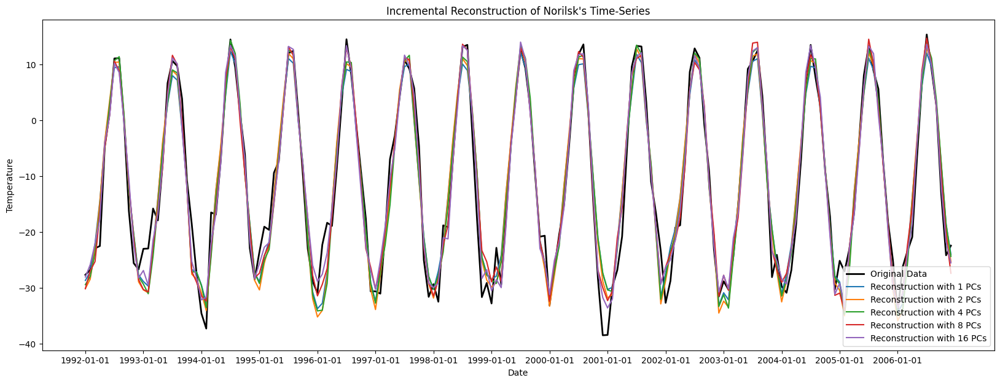

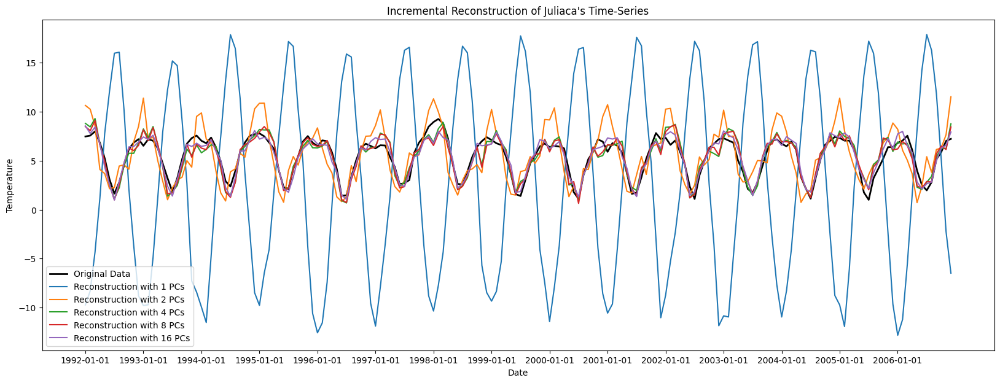

...

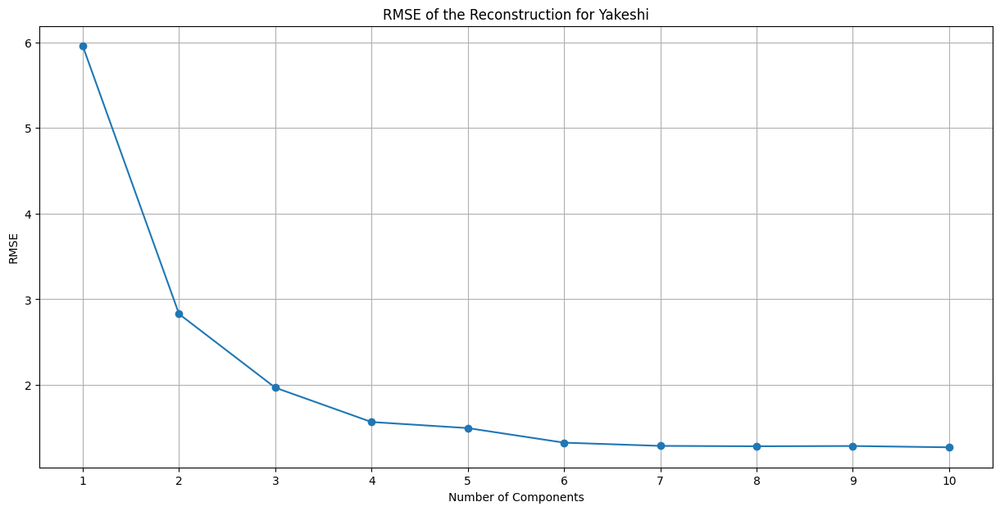

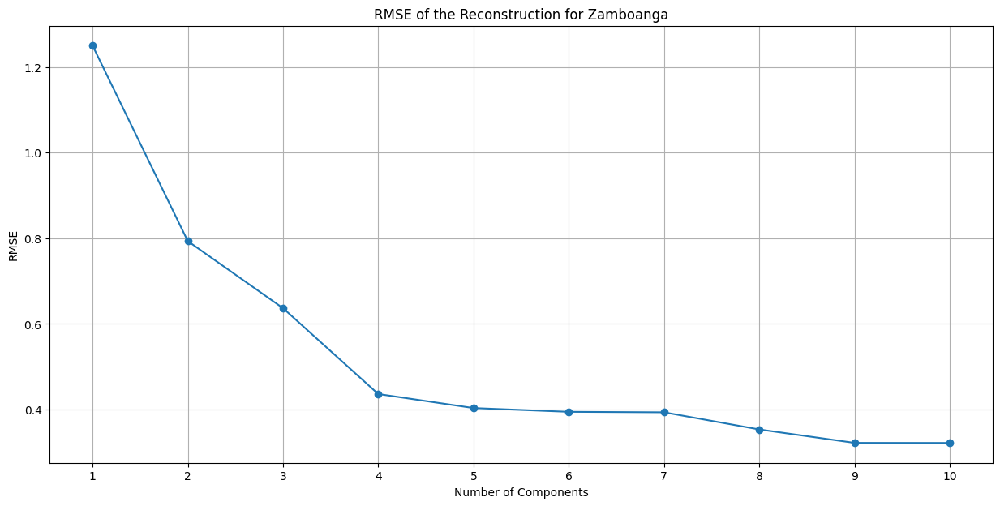

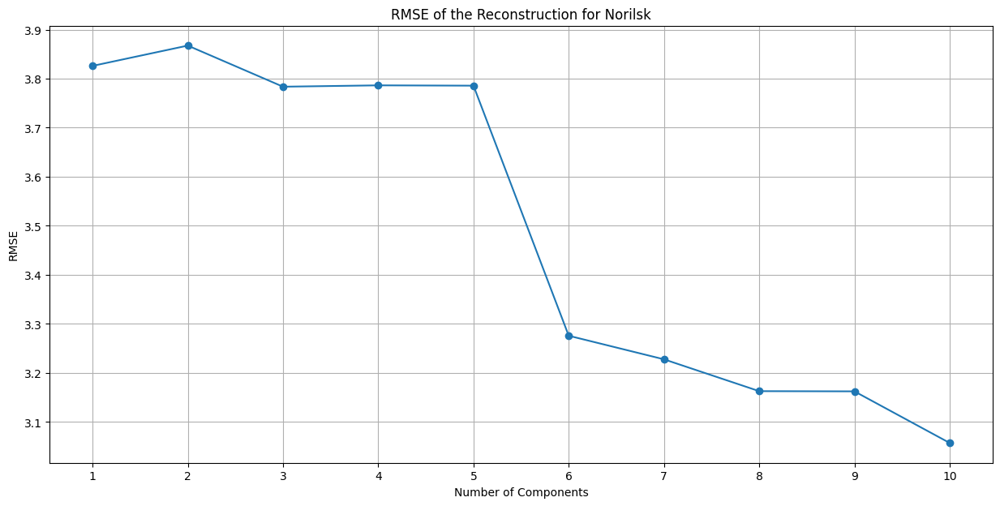

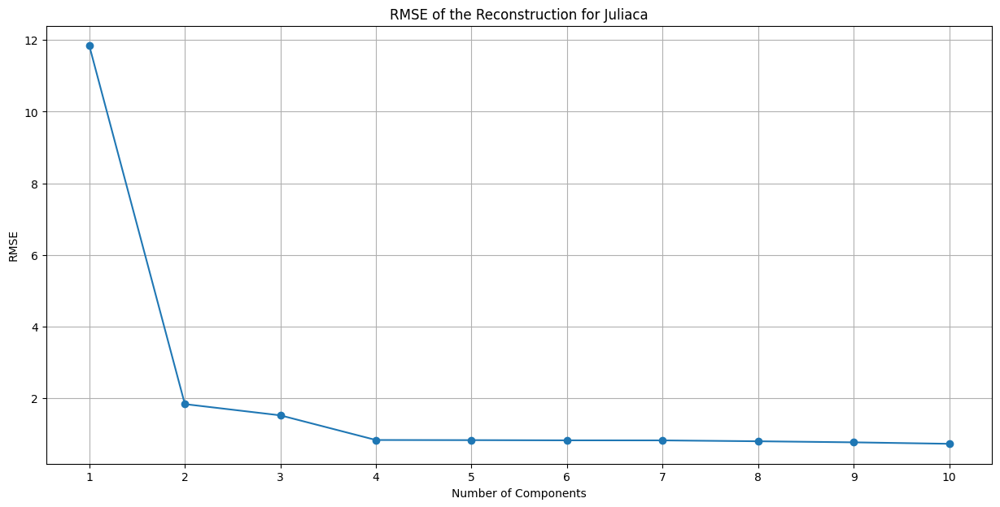

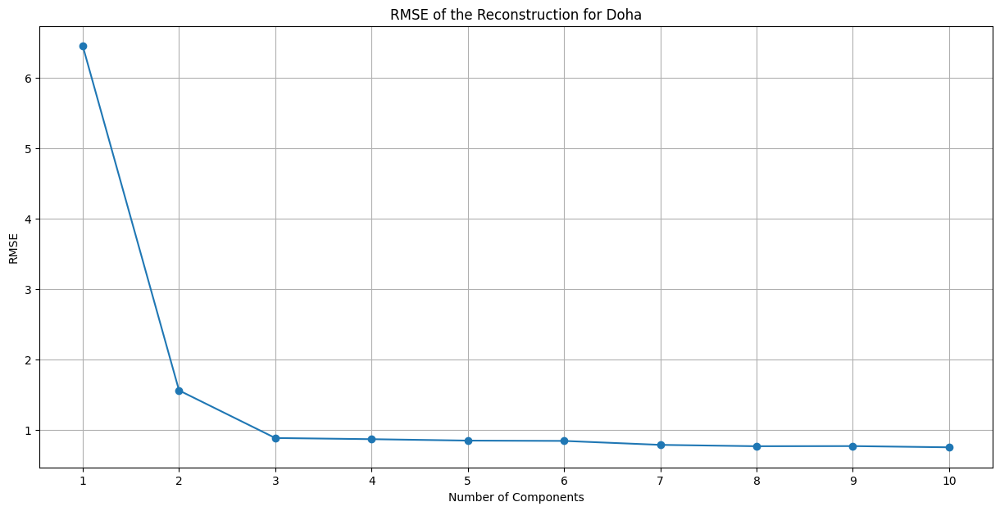

In [8]:
from numpy.linalg import svd

# Compute SVD
U, S, Vt = svd(X_std, full_matrices=False)

# Using SVD means we do not need to compute the covariance matrix, hence no need to sort eigenvalues
# The singular values (S) are already sorted in descending order by convention

def plot_city_figures_svd(original_df, city_names):
    # Plot the original time-series for the specified city
    fig, axes = plt.subplots(len(city_names), 1, figsize=(20, len(city_names) * 5), sharex=True)
    if len(city_names) == 1:
        axes = [axes]  # Ensure axes is a list even for one city
    for i, city in enumerate(city_names):
        city_data = original_df.loc[city].values
        axes[i].plot(original_df.columns, city_data)
        axes[i].set_title(f"Temperature Time Series for {city}")
        axes[i].set_xlabel('Date')
        axes[i].set_ylabel('Temperature')
        selected_dates = original_df.columns[::12]
        axes[i].set_xticks(selected_dates)
    plt.show()

    # The incremental reconstruction of the original time-series for city
    for city in city_names:
        city_data_std = X_std[original_df.index == city]
        PC_count = [1, 2, 4, 8, 16]

        plt.figure(figsize=(20, 7))
        plt.plot(original_df.columns, original_df.loc[city].values, label='Original Data', color='black', linewidth=2)

        for pc in PC_count:
            # SVD uses U matrix for the eigenvectors and S for singular values
            W = Vt[:pc, :]
            projX = np.dot(city_data_std, W.T)

            # Reconstruction
            ReconX = scaler.inverse_transform(np.dot(projX, W))

            plt.plot(original_df.columns, ReconX.flatten(), label=f'Reconstruction with {pc} PCs')
        plt.title(f"Incremental Reconstruction of {city}'s Time-Series")
        plt.xlabel('Date')
        plt.ylabel('Temperature')
        selected_dates = original_df.columns[::12]
        plt.xticks(selected_dates)
        plt.legend()
        plt.show()

    # Calculate best reconstruction residual error and generate a plot
    for city in city_names:
        city_data_std = X_std[original_df.index == city]
        # Best reconstruction is when there are 16 principal components
        W = Vt[:16, :]
        projX = np.dot(city_data_std, W.T)

        best_recon = scaler.inverse_transform(np.dot(projX, W))
        residuals = original_df.loc[city].values - best_recon.flatten()

        plt.figure(figsize=(15, 7))
        plt.plot(residuals, label='Residual Error', color='red')
        plt.title(f"Residual Error for {city}'s Time-Series Reconstruction")
        plt.xlabel('Date')
        plt.ylabel('Residual Error')
        plt.legend()
        plt.show()

    RMSE_values_SVD = []
    # Plot the RMSE of the reconstruction as a function of the number of included components
    for city in city_names:
        city_data_std = X_std[original_df.index == city]
        RMSE_values = []
        for pc in range(1, 11):
            W = Vt[:pc, :]
            projX = np.dot(city_data_std, W.T)
            ReconX = scaler.inverse_transform(np.dot(projX, W))

            RMSE = np.sqrt(np.mean((original_df.loc[city].values - ReconX.flatten()) ** 2))
            RMSE_values.append(RMSE)

        plt.figure(figsize=(15, 7))
        plt.plot(range(1, 11), RMSE_values, 'o-')
        plt.title(f"RMSE of the Reconstruction for {city}")
        plt.xlabel('Number of Components')
        plt.ylabel('RMSE')
        plt.xticks(range(1, 11))
        plt.grid(True)
        plt.show()

        RMSE_values_SVD.append(RMSE_values)

    return RMSE_values_SVD

# Run the function with SVD for the specified city names
RMSE_values_SVD = plot_city_figures_svd(original_df, city_names)


Standardization is required because the unstandardized data may be unbalanced and affect the performance of SVD. Standardization is important for both PCA and SVD.

However, covariance matrix is not necessarily required for SVD because it calculates the singular vectors and singular values directly from the standardized data without using covariance matrix. In this example, the SVD is calculated from X_std directly.

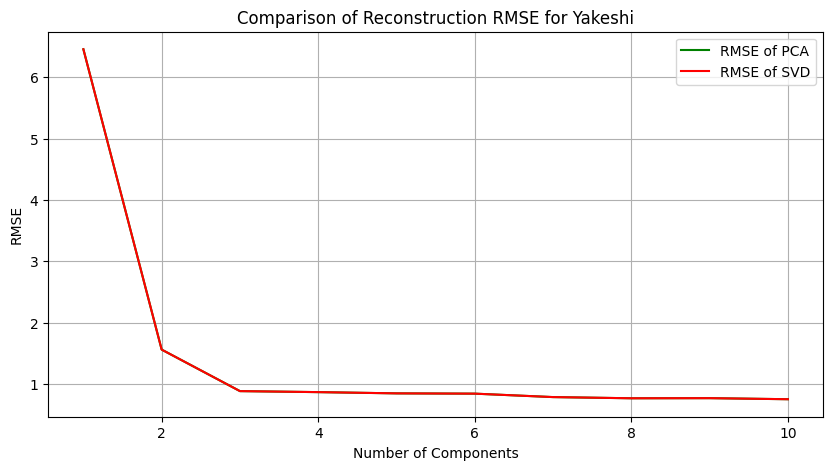

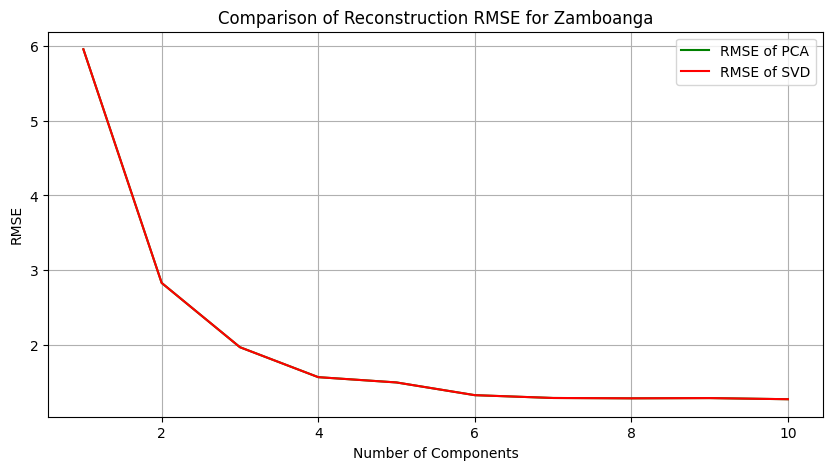

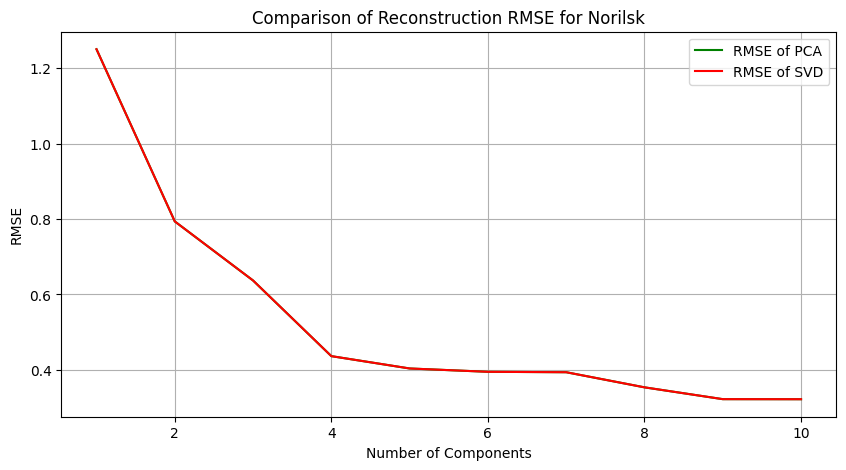

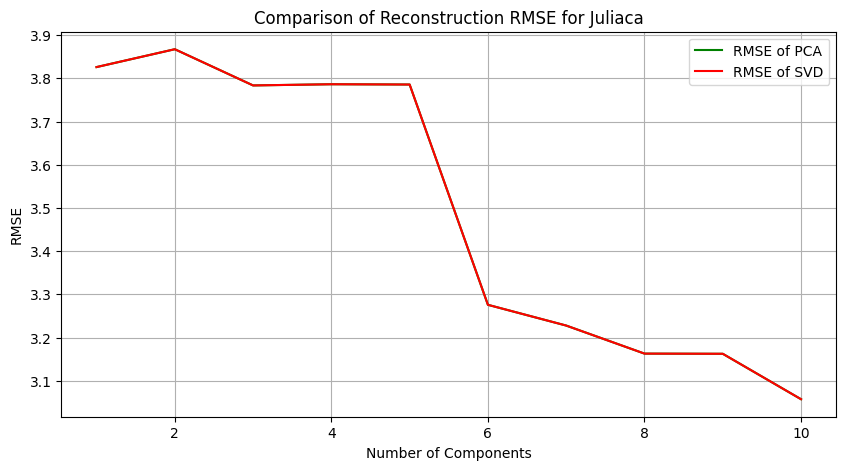

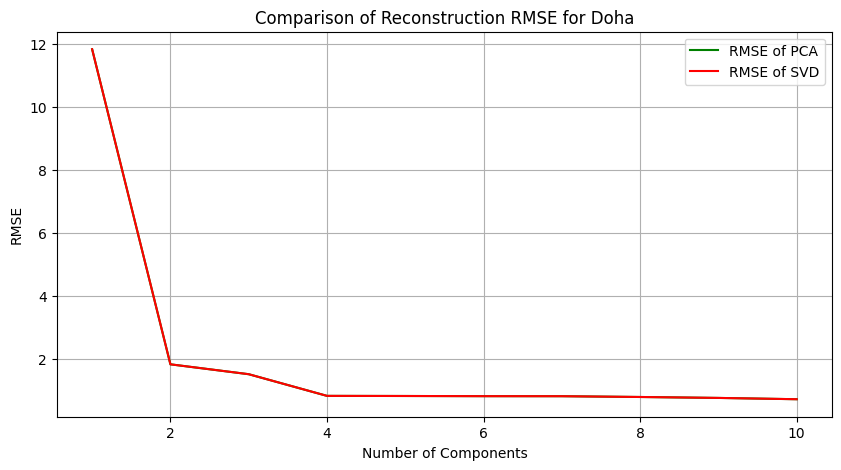

In [9]:
def compare_pca_svd(RMSE_values_PCA, RMSE_values_SVD, city_names):
    for i, city in enumerate(city_names):
        plt.figure(figsize=(10, 5))  # Create a new figure for each city
        plt.plot(range(1, 11), RMSE_values_PCA[i-1], label='RMSE of PCA', c='g')
        plt.plot(range(1, 11), RMSE_values_SVD[i-1], label='RMSE of SVD', c='r')
        plt.xlabel('Number of Components')
        plt.ylabel('RMSE')
        plt.title(f'Comparison of Reconstruction RMSE for {city}')
        plt.legend()
        plt.grid(True)
        plt.show()
compare_pca_svd(RMSE_values_PCA, RMSE_values_SVD, city_names)

From the RMSE plot above, the RMSE for PCA and SVD are almost the same because both SVD and eigendecomposition are used to create linear mappings that identify same principal components just by different approaches. Their PC reconstruction and residual error are also the same from their shape and distribution.

PCA uses the covariance matrix while SVD uses standardized data directly, the result would be not similar only if the error in round issues, calculation, coding or number of PCs.

# Part 5: Let's collect another dataset! [2 Marks]
Create another dataset similar to the one provided in your handout using the raw information on average temperatures per states (not cities) provided [here](https://github.com/Sabaae/Dataset/blob/main/TemperaturesbyState.csv). **[1]**

You need to manipulate the data to organize it in the desired format (i.e., the same format that was in previous parts). If there is a missing value for the average temperature of a particular state at a given date, make sure to remove that date completely from the dataset, even if the data of that specific date exists for other states.

You are free to use any tools you like, from Excel to Python! In the end, you should have a new CSV file with more dates (features) compared to the provided dataset. How many features does the final dataset have? How many states are there?


Upload your new dataset (in CSV format) to your colab notebook and repeat part 4. When analyzing the states, you may use `Jilin`, `Nunavut`, `Rio Grande Do Norte`, `Louisiana`, and `Tasmania`. **[1]**


The code below helps you to upload your new CSV file to your colab session.

In [10]:
### YOUR CODE HERE ###
import pandas as pd
data_state = pd.read_csv(
    filepath_or_buffer='https://raw.githubusercontent.com/Sabaae/Dataset/main/TemperaturesbyState.csv',
    index_col=0
)

In [11]:
# Drop the AverageTemperatureUncertainty column, use the new df for pivotting
df = data_state.drop(columns='AverageTemperatureUncertainty')
# Drop the rows with NA values
df = df.dropna(subset=['AverageTemperature'])
# Set the index of date column into a real column with name 'dt'
df_reset = df.reset_index()

In [12]:
df_state = df_reset.pivot(index='State', columns='dt', values='AverageTemperature')

num_features = df_state.shape[1] - 1 # Number of features
num_states = df_state.shape[0]  # Number of states

print(f"Number of features (dates): {num_features}")
print(f"Number of states: {num_states}")


Number of features (dates): 608
Number of states: 241


In [15]:
from google.colab import files
uploaded = files.upload()

Saving Transposed_TemperaturesbyState.csv to Transposed_TemperaturesbyState.csv


In [16]:
df_state = pd.read_csv('Transposed_TemperaturesbyState.csv', index_col=0)


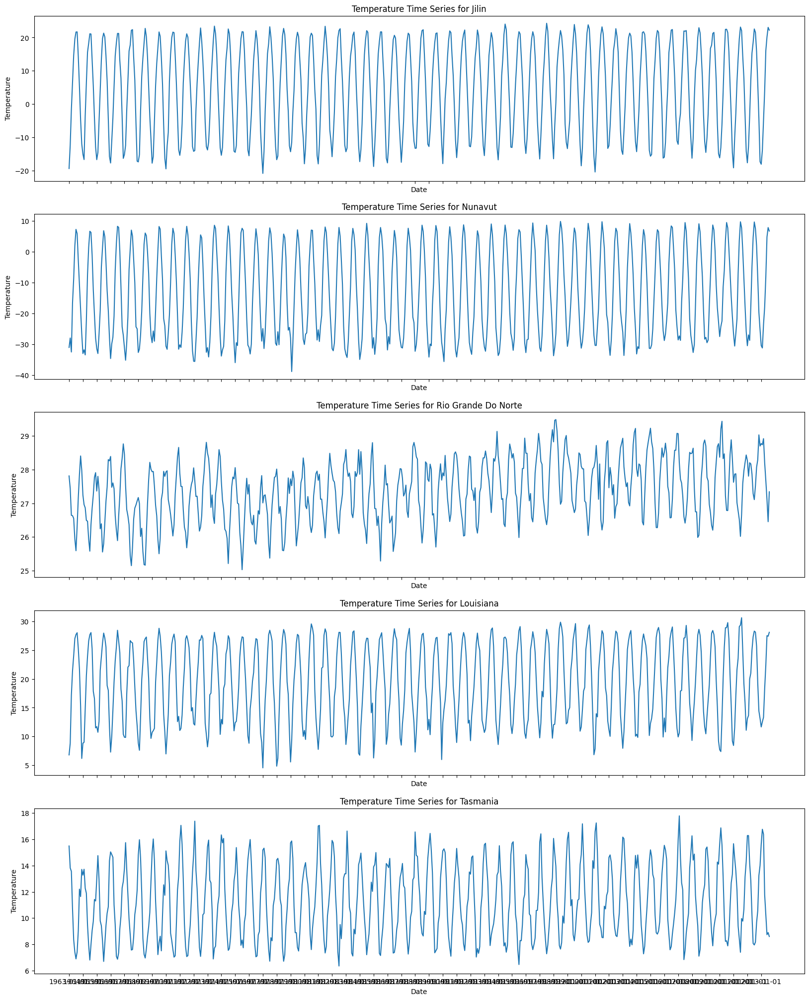

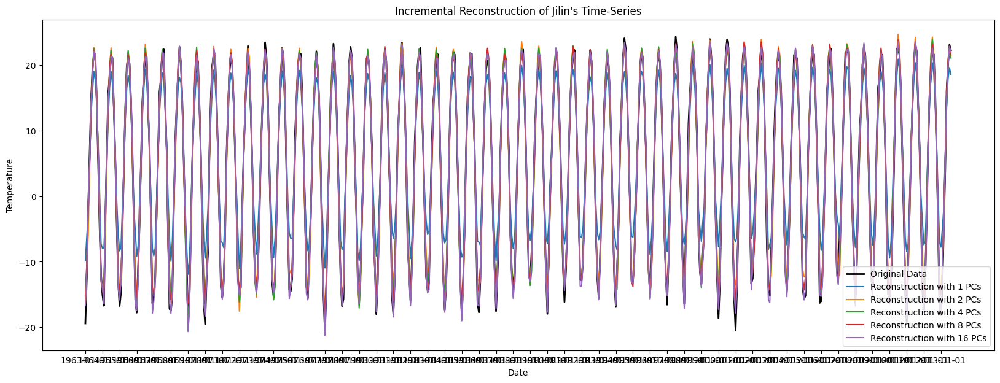

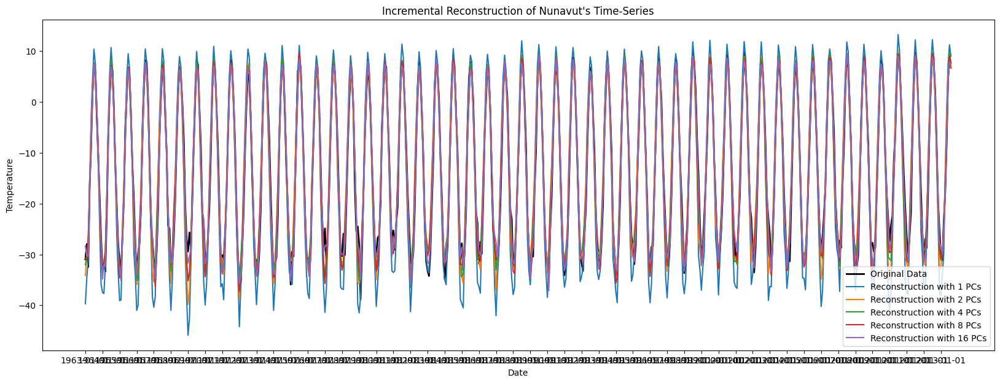

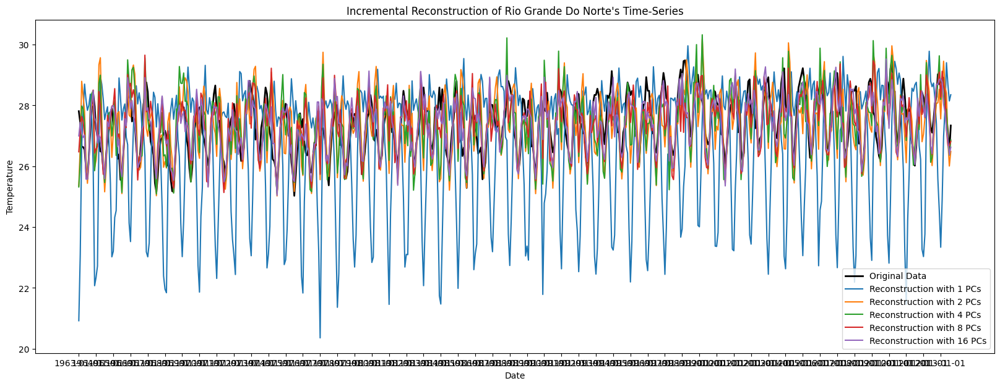

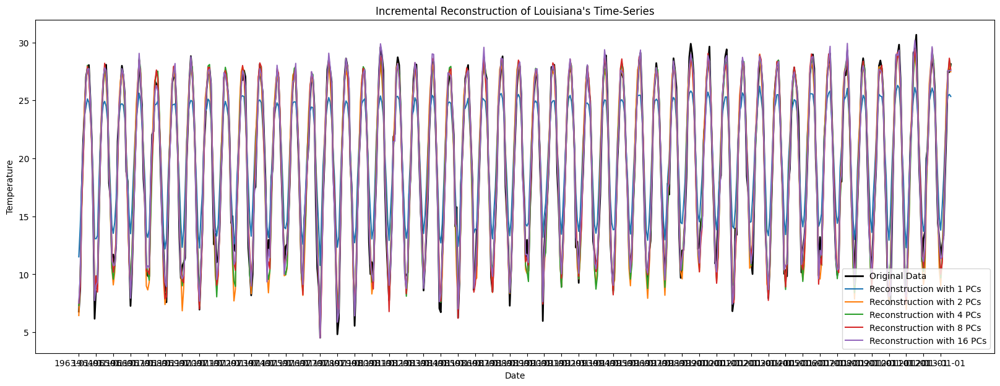

...

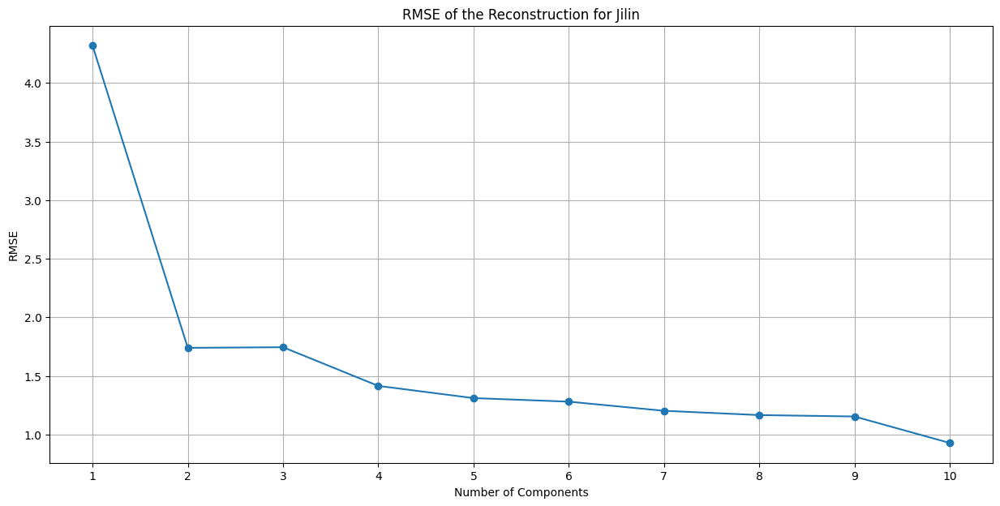

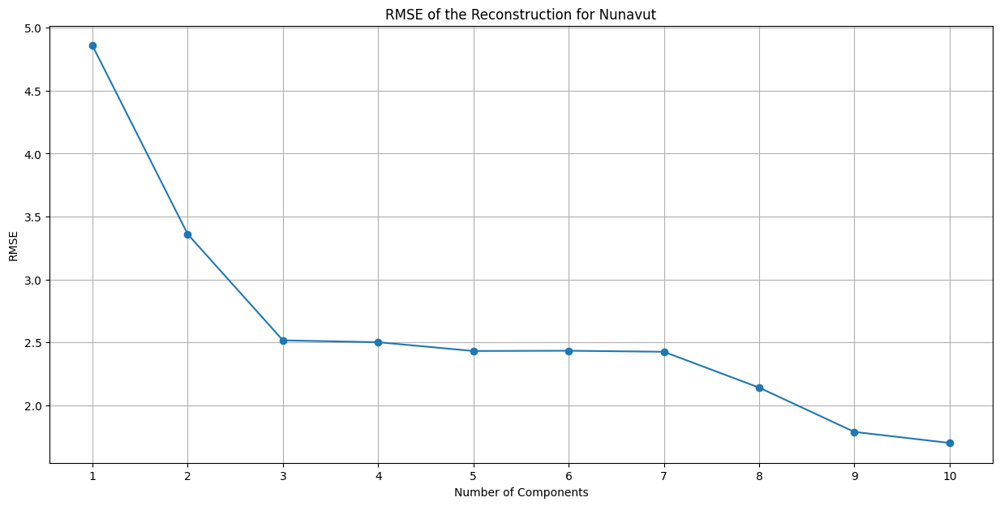

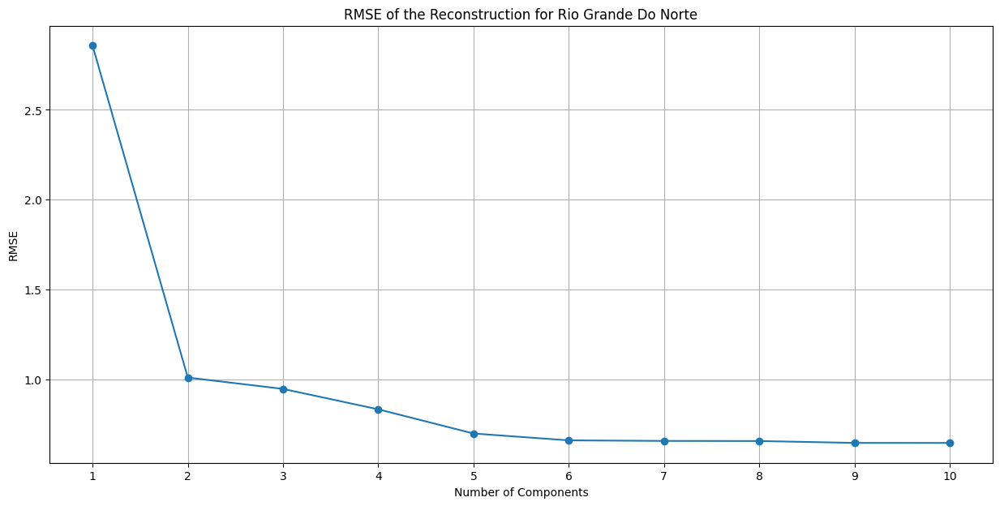

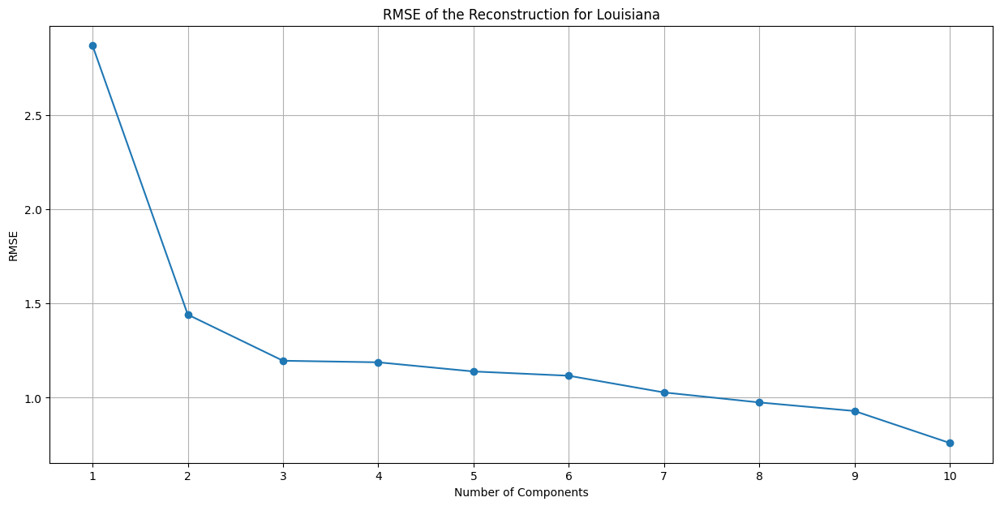

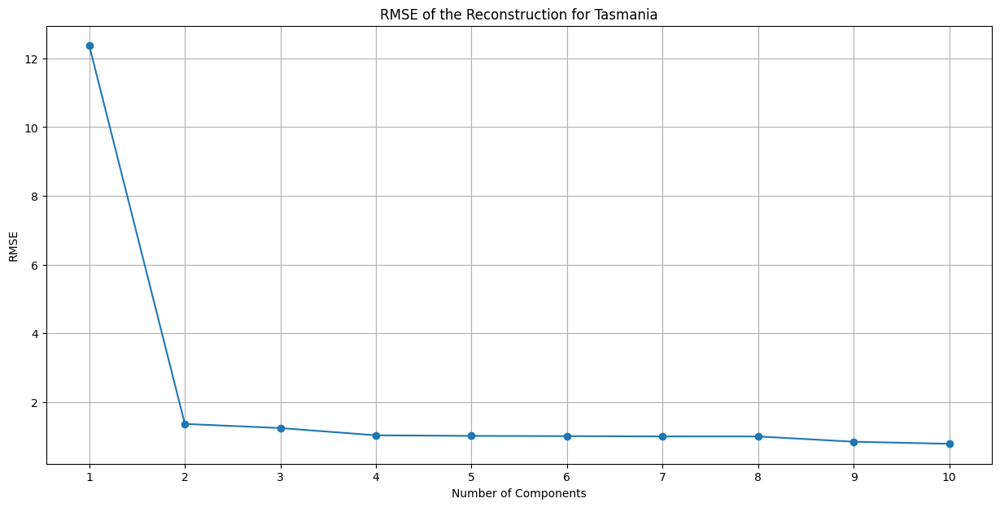

In [17]:
# PCA for state temperature
from sklearn.preprocessing import StandardScaler

state_names = ['Jilin', 'Nunavut', 'Rio Grande Do Norte', 'Louisiana', 'Tasmania']

scaler = StandardScaler().fit(df_state)
X_std = scaler.transform(df_state)

# Compute sorted eigenvalues and eigenvectors
C = np.dot(X_std.T, X_std) / (n-1)
eigenValues, eigenVectors = np.linalg.eigh(C)
args = (-eigenValues).argsort()
sorted_eigenvalues = eigenValues[args]
sorted_eigenvectors = eigenVectors[:, args]

def plot_state_figures(df_state, state_names):
    # Plot the original time-series for the specified state
    fig, axes = plt.subplots(len(state_names), 1, figsize=(20, len(state_names) * 5), sharex=True)
    if len(state_names) == 1:
        axes = [axes]  # Ensure axes is a list even for one state
    for i, state in enumerate(state_names):
        state_data = df_state.loc[state].values
        axes[i].plot(df_state.columns, state_data)
        axes[i].set_title(f"Temperature Time Series for {state}")
        axes[i].set_xlabel('Date')
        axes[i].set_ylabel('Temperature')
        selected_dates = df_state.columns[::12]
        axes[i].set_xticks(selected_dates)
    plt.show()

    # The incremental reconstruction of the original time-series for state
    for state in state_names:
        state_data_std = X_std[df_state.index == state]
        PC_count = [1, 2, 4, 8, 16]

        plt.figure(figsize=(20, 7))
        plt.plot(df_state.columns, df_state.loc[state].values, label='Original Data', color='black', linewidth=2)

        for pc in PC_count:
            W = sorted_eigenvectors[:, :pc]
            projX = np.dot(state_data_std, W)

            # Reconstruction
            ReconX = scaler.inverse_transform(np.dot(projX, W.T))

            plt.plot(df_state.columns, ReconX.flatten(), label=f'Reconstruction with {pc} PCs')
        plt.title(f"Incremental Reconstruction of {state}'s Time-Series")
        plt.xlabel('Date')
        plt.ylabel('Temperature')
        selected_dates = df_state.columns[::12]
        plt.xticks(selected_dates)
        plt.legend()
        plt.show()

    # Calculate best reconstruction residual error and generate a plot
    for state in state_names:
      state_data_std = X_std[df_state.index == state]
      # Best reconstruction is when there are 16 principal components
      W = sorted_eigenvectors[:, :16]
      projX = np.dot(state_data_std, W)

      best_recon = scaler.inverse_transform(np.dot(projX, W.T))
      residuals = df_state.loc[state].values - best_recon.flatten()

      plt.figure(figsize=(15, 7))
      plt.plot(residuals, label='Residual Error', color='red')
      plt.title(f"Residual Error for {state}'s Time-Series Reconstruction")
      plt.xlabel('Date')
      plt.ylabel('Residual Error')
      plt.legend()
      plt.show()

    RMSE_values_PCA_state = []

    for state in state_names:
      state_data_std = X_std[df_state.index == state]
      RMSE_values = []
      for pc in range(1, 11):
        W = sorted_eigenvectors[:, :pc]
        projX = np.dot(state_data_std, W)
        ReconX = scaler.inverse_transform(np.dot(projX, W.T))

        RMSE = np.sqrt(np.mean((df_state.loc[state].values - ReconX.flatten()) ** 2))
        RMSE_values.append(RMSE)

      plt.figure(figsize=(15, 7))
      plt.plot(range(1, 11), RMSE_values, 'o-')
      plt.title(f"RMSE of the Reconstruction for {state}")
      plt.xlabel('Number of Components')
      plt.ylabel('RMSE')
      plt.xticks(range(1, 11))
      plt.grid(True)
      plt.show()

      RMSE_values_PCA_state.append(RMSE_values)

    return RMSE_values_PCA_state


RMSE_values_PCA_state = plot_state_figures(df_state, state_names)


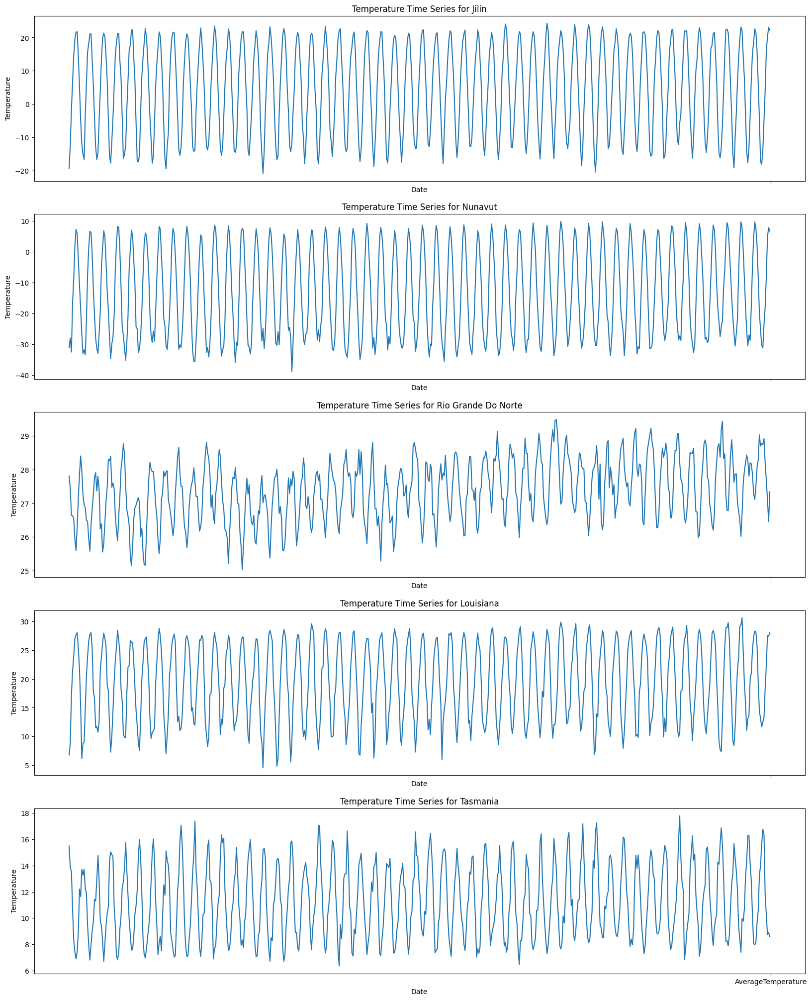

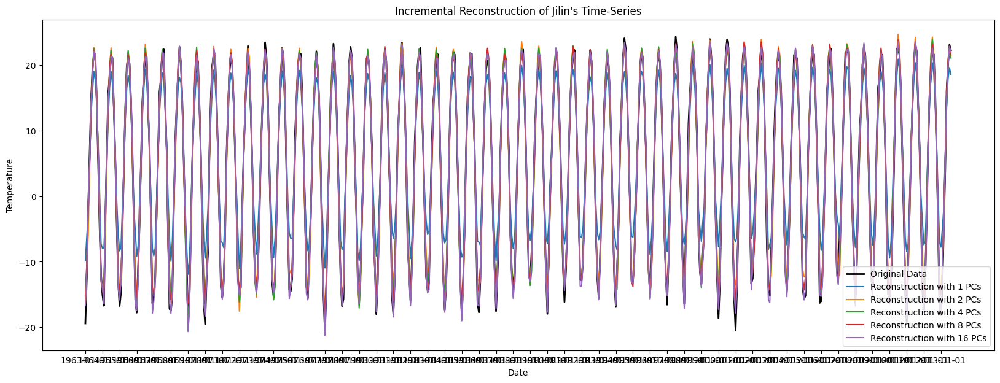

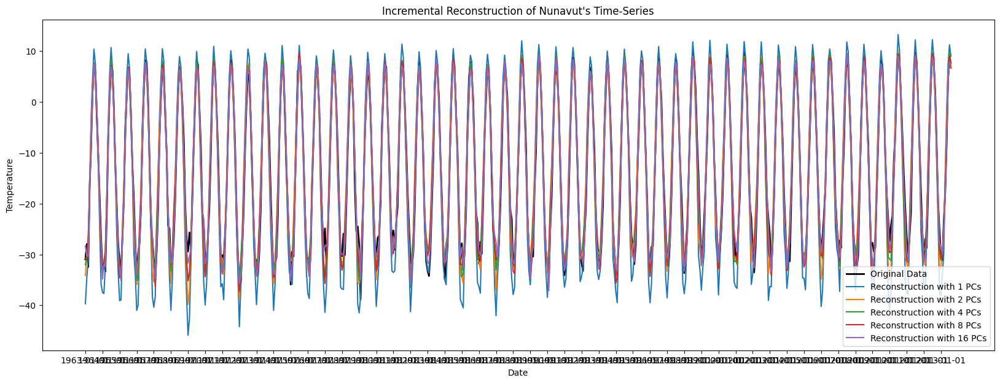

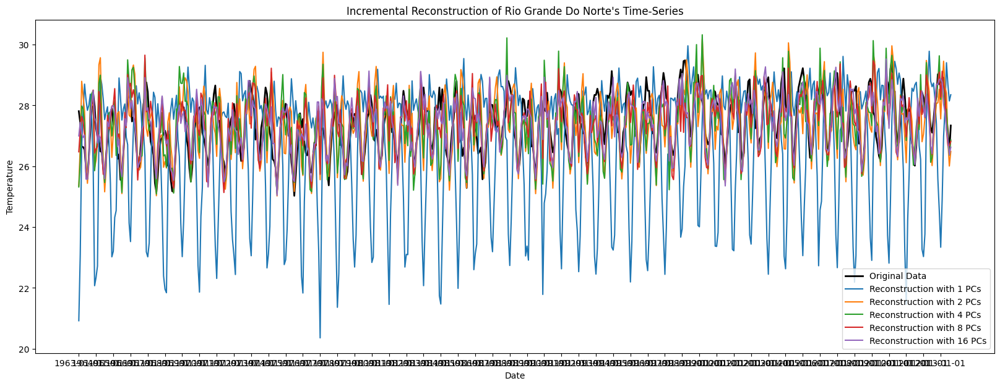

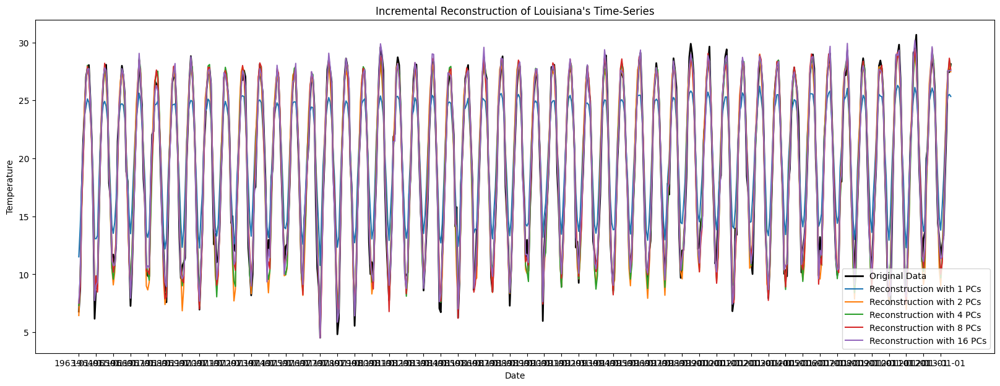

...

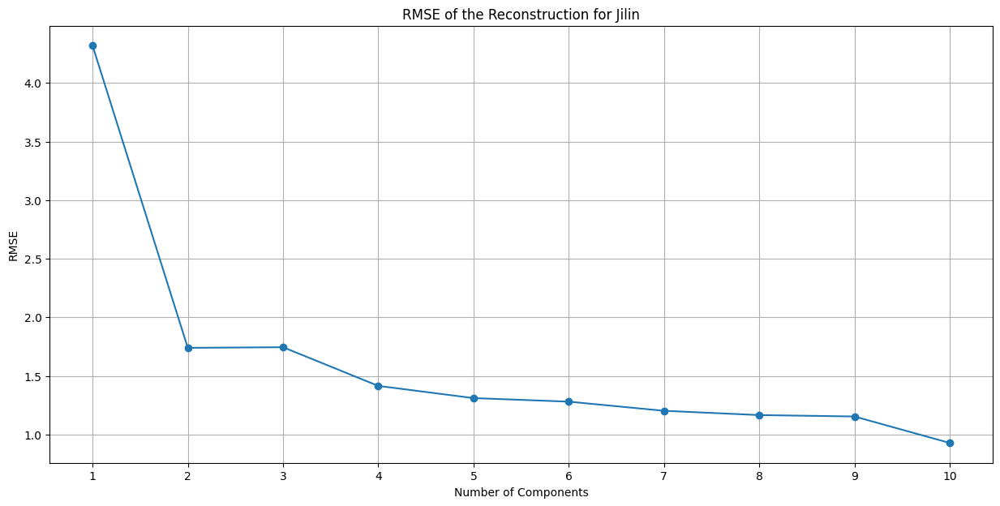

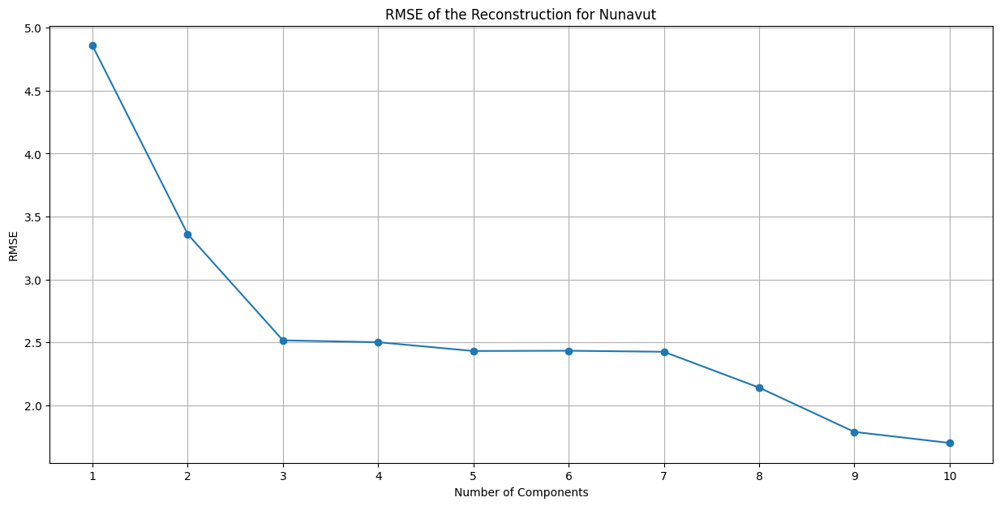

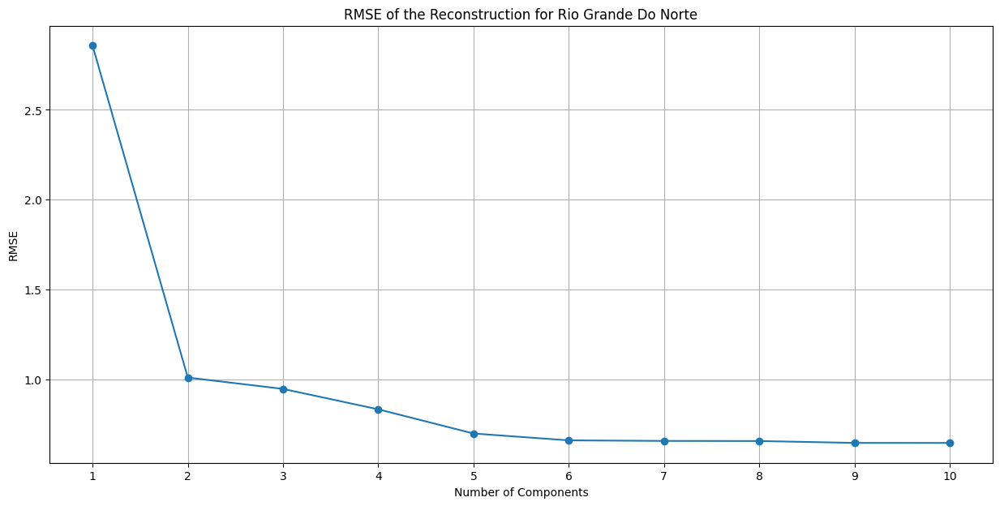

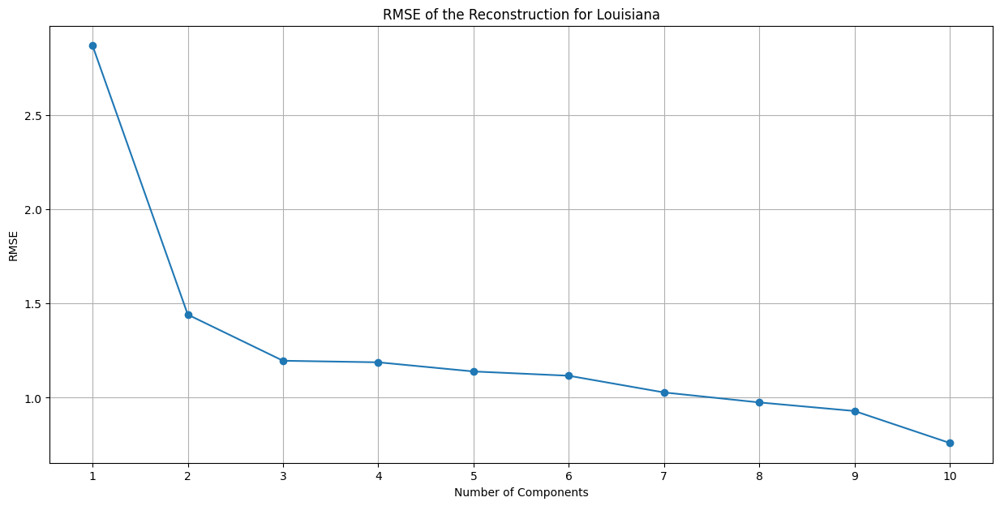

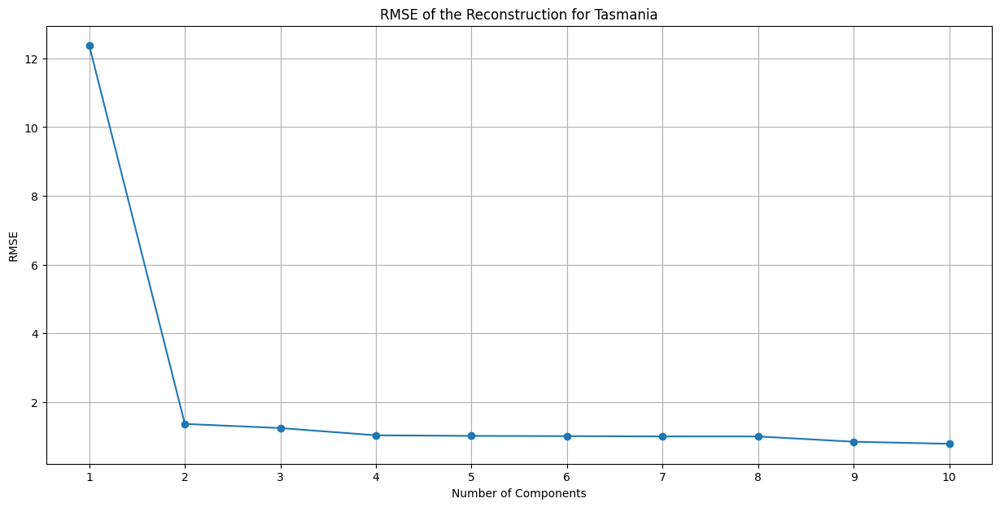

In [18]:
# SVD for state temperature
scaler = StandardScaler()
X_std_state = scaler.fit_transform(df_state)

# Compute SVD
U, S, Vt = np.linalg.svd(X_std_state, full_matrices=False)

# Create State names list
state_names = ['Jilin', 'Nunavut', 'Rio Grande Do Norte', 'Louisiana', 'Tasmania']

def plot_state_figures_svd(df_state, state_names):
    # Plot the original time-series for the specified state
    fig, axes = plt.subplots(len(state_names), 1, figsize=(20, len(state_names) * 5), sharex=True)
    if len(state_names) == 1:
        axes = [axes]  # Ensure axes is a list even for one state
    for i, state in enumerate(state_names):
        state_data = df_state.loc[state].values
        axes[i].plot(df_state.columns, state_data)
        axes[i].set_title(f"Temperature Time Series for {state}")
        axes[i].set_xlabel('Date')
        axes[i].set_ylabel('Temperature')
        selected_dates = df.columns[::12]
        axes[i].set_xticks(selected_dates)
    plt.show()

    # The incremental reconstruction of the original time-series for state
    for state in state_names:
        state_data_std = X_std_state[df_state.index == state]
        PC_count = [1, 2, 4, 8, 16]

        plt.figure(figsize=(20, 7))
        plt.plot(df_state.columns, df_state.loc[state].values, label='Original Data', color='black', linewidth=2)

        for pc in PC_count:
            # SVD uses U matrix for the eigenvectors and S for singular values
            W = Vt[:pc, :]
            projX = np.dot(state_data_std, W.T)

            # Reconstruction
            ReconX = scaler.inverse_transform(np.dot(projX, W))

            plt.plot(df_state.columns, ReconX.flatten(), label=f'Reconstruction with {pc} PCs')
        plt.title(f"Incremental Reconstruction of {state}'s Time-Series")
        plt.xlabel('Date')
        plt.ylabel('Temperature')
        selected_dates = df_state.columns[::12]
        plt.xticks(selected_dates)
        plt.legend()
        plt.show()

    # Calculate best reconstruction residual error and generate a plot
    for state in state_names:
        state_data_std = X_std_state[df_state.index == state]
        # Best reconstruction is when there are 16 principal components
        W = Vt[:16, :]
        projX = np.dot(state_data_std, W.T)

        best_recon = scaler.inverse_transform(np.dot(projX, W))
        residuals = df_state.loc[state].values - best_recon.flatten()

        plt.figure(figsize=(15, 7))
        plt.plot(residuals, label='Residual Error', color='red')
        plt.title(f"Residual Error for {state}'s Time-Series Reconstruction")
        plt.xlabel('Date')
        plt.ylabel('Residual Error')
        plt.legend()
        plt.show()

    RMSE_values_SVD_state = []
    # Plot the RMSE of the reconstruction as a function of the number of included components
    for state in state_names:
        state_data_std = X_std_state[df_state.index == state]
        RMSE_values = []
        for pc in range(1, 11):
            W = Vt[:pc, :]
            projX = np.dot(state_data_std, W.T)
            ReconX = scaler.inverse_transform(np.dot(projX, W))

            RMSE = np.sqrt(np.mean((df_state.loc[state].values - ReconX.flatten()) ** 2))
            RMSE_values.append(RMSE)

        plt.figure(figsize=(15, 7))
        plt.plot(range(1, 11), RMSE_values, 'o-')
        plt.title(f"RMSE of the Reconstruction for {state}")
        plt.xlabel('Number of Components')
        plt.ylabel('RMSE')
        plt.xticks(range(1, 11))
        plt.grid(True)
        plt.show()

        RMSE_values_SVD_state.append(RMSE_values)

    return RMSE_values_SVD_state

# Run the function with SVD for the specified city names
RMSE_values_SVD_state = plot_state_figures_svd(df_state, state_names)

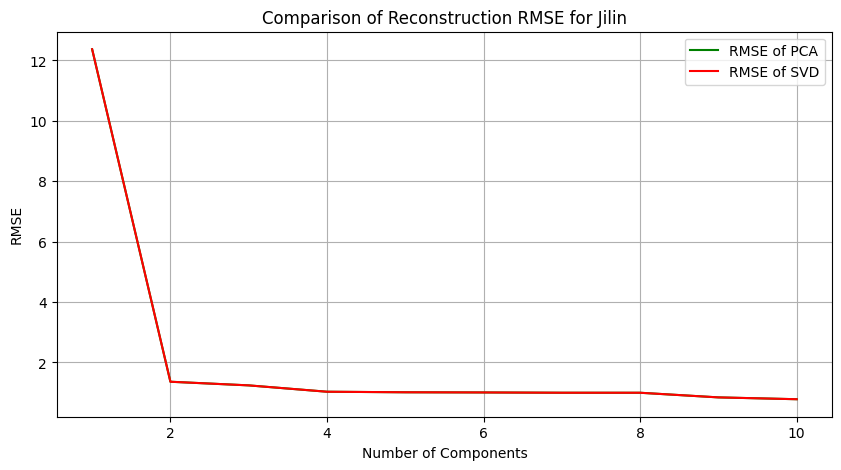

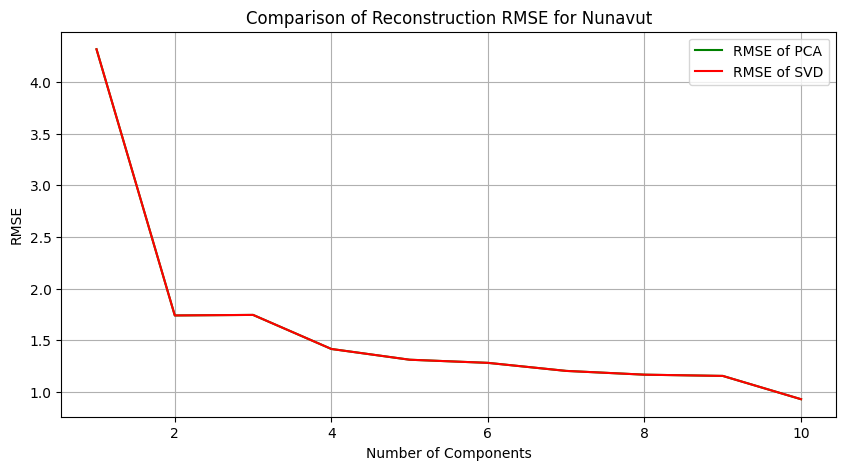

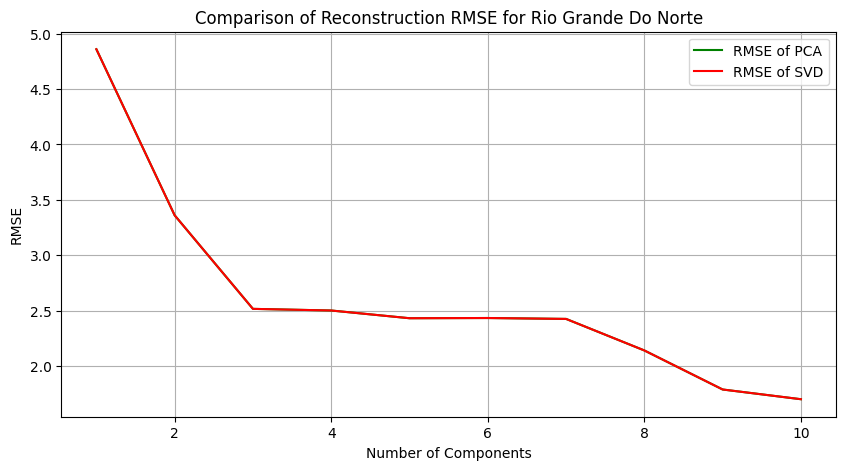

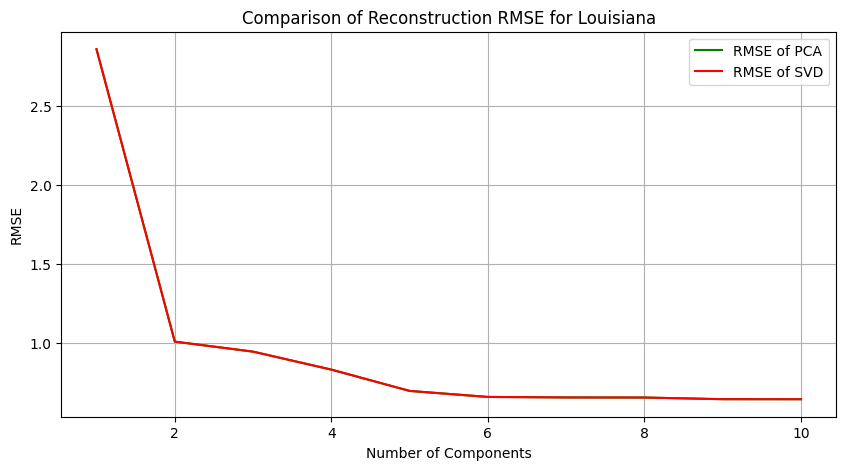

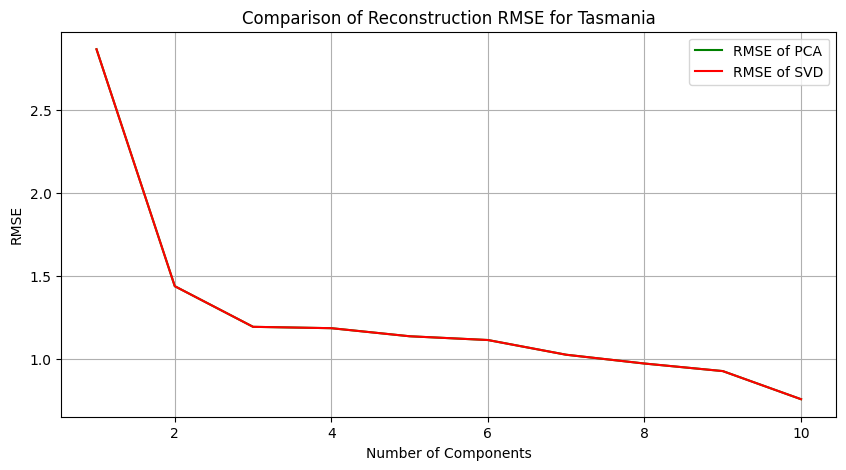

In [19]:
def compare_pca_svd_state(RMSE_values_PCA_state, RMSE_values_SVD_state, state_names):
    for i, state in enumerate(state_names):
        plt.figure(figsize=(10, 5))  # Create a new figure for each state
        plt.plot(range(1, 11), RMSE_values_PCA_state[i-1], label='RMSE of PCA', c='g')
        plt.plot(range(1, 11), RMSE_values_SVD_state[i-1], label='RMSE of SVD', c='r')
        plt.xlabel('Number of Components')
        plt.ylabel('RMSE')
        plt.title(f'Comparison of Reconstruction RMSE for {state}')
        plt.legend()
        plt.grid(True)
        plt.show()
compare_pca_svd_state(RMSE_values_PCA_state, RMSE_values_SVD_state, state_names)

From the comparison RMSE for PCA and SVD plot associated with state temperature above, the RMSE for PCA and SVD are almost the same because both SVD and eigendecomposition are used to create linear mappings that identify same principal components just by different approaches.

PCA uses the covariance matrix while SVD uses standardized data directly, the result would be not similar only if the error in round issues, calculation, coding or number of PCs.

In addition, all the reconstruction for PCA and SVD are almost identical because they calculate the same projection results. And their residual error is then identical.

# References

Understanding PCA and SVD:

1. https://towardsdatascience.com/pca-and-svd-explained-with-numpy-5d13b0d2a4d8

2. https://stats.stackexchange.com/questions/134282/relationship-between-svd-and-pca-how-to-use-svd-to-perform-pca

3. https://stats.stackexchange.com/questions/2691/making-sense-of-principal-component-analysis-eigenvectors-eigenvalues

4. https://hadrienj.github.io/posts/Deep-Learning-Book-Series-2.8-Singular-Value-Decomposition/

PCA:

1. Snippets from: https://plot.ly/ipython-notebooks/principal-component-analysis/

2. https://www.value-at-risk.net/principal-component-analysis/

Temperature Data:

1. https://www.kaggle.com/datasets/berkeleyearth/climate-change-earth-surface-temperature-data

2. https://berkeleyearth.org/data/



**Reference:**

1: APS1070 Tutorial 3

2: SKlearn:
https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.StandardScaler.html#sklearn.preprocessing.StandardScaler.inverse_transform

3: Declaration of using AI tools:
https://chat.openai.com/share/4f051877-0ec4-4861-b470-2ef1e2883753